In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import torch
import random
from tqdm import tqdm

# print directory
import os
print(os.getcwd())
os.chdir("../..")
print(os.getcwd())

#from src.models.sparse_autoencoder import *
from src.functions.sae_training import *
from src.functions.sae_analysis_sim import *
from src.models.autoencoder import *
from src.visualization.plotting import *

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# set a random seed
seed = 0

torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

data_dir = '/projects/heads/data/simulation/singlecell/'

/home/dbm829/projects/interpreting_omics_models/02_experiments/simulation
/home/dbm829/projects/interpreting_omics_models


### test SAE metrics

In [2]:
# load data
complexity = 'high'

for seed in range(10):
    temp = torch.load(data_dir+'large_{}-complexity_rs{}_y.pt'.format(complexity, seed), weights_only=False)
    if seed == 0:
        rna_counts = temp
    else:
        rna_counts = torch.cat((rna_counts, temp), dim=0)

In [5]:
# load encoder

n_samples = 1000
latent_dim = 150
model_depth = 2

encoder = Encoder(20000, latent_dim, model_depth).to(device)
model_name = 'sim2_large_{}-complexity_{}-depth_{}-latent_{}-samples'.format(complexity, model_depth, latent_dim, n_samples)
encoder = torch.load('03_results/models/{}_encoder.pth'.format(model_name)).cpu()

reps = encoder(rna_counts).detach()

/tmp/ipykernel_1322439/2767392440.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder = torch.load('03_results/models/{}_encoder.pth'.format(model_name)).cpu()


In [6]:
del rna_counts
del encoder

In [7]:
input_size = latent_dim
batch_size = 128
train_data = reps.clone().to(device)
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)

In [8]:
hidden_factor = 10
lr = 1e-3
l1_weight = 1e-3

sae_model, loss = train_sae(train_loader, input_size=input_size, hidden_factor=hidden_factor, lr=lr, l1_weight=l1_weight, n_epochs=500, sae_type='bricken')

In [10]:
reps_reconstructed, activations = sae_model(reps.to(device))
del reps_reconstructed

# load data
complexity = 'high'

for seed in range(10):
    temp_y = torch.load(data_dir+'large_{}-complexity_rs{}_y.pt'.format(complexity, seed), weights_only=False)
    temp_x0 = torch.load(data_dir+'large_{}-complexity_rs{}_x0.pt'.format(complexity, seed), weights_only=False)
    temp_x1 = torch.load(data_dir+'large_{}-complexity_rs{}_x1.pt'.format(complexity, seed), weights_only=False)
    temp_x2 = torch.load(data_dir+'large_{}-complexity_rs{}_x2.pt'.format(complexity, seed), weights_only=False)
    temp_ct = torch.load(data_dir+'large_{}-complexity_rs{}_ct.pt'.format(complexity, seed), weights_only=False)
    temp_cov = torch.load(data_dir+'large_{}-complexity_rs{}_co.pt'.format(complexity, seed), weights_only=False)
    if seed == 0:
        rna_counts = temp
        x0 = temp_x0
        x1 = temp_x1
        x2 = temp_x2
        ct = temp_ct
        co = temp_cov
    else:
        rna_counts = torch.cat((rna_counts, temp), dim=0)
        x0 = torch.cat((x0, temp_x0), dim=0)
        x1 = torch.cat((x1, temp_x1), dim=0)
        x2 = torch.cat((x2, temp_x2), dim=0)
        ct = torch.cat((ct, temp_ct), dim=0)
        co = torch.cat((co, temp_cov), dim=0)

In [ ]:
x_metrics = run_sae_analysis(sae_model, train_loader, activations, x2)

In [25]:
avg_active_units = x_metrics[2]
n_unique = x_metrics[3]
n_redundant = x_metrics[4]
n_per_attribute = x_metrics[5]
highest_corrs = x_metrics[6]
avg_per_attribute = np.mean(n_per_attribute)
avg_highest_corrs = np.mean(highest_corrs)

In [26]:
avg_highest_corrs

0.12645799115952505

# identify vectors of superposition

In [2]:
from sklearn.linear_model import LinearRegression
from tqdm import tqdm

def identify_superpositions(r, y):
    #reg_coeffs_reps = np.zeros((y.shape[0], r.shape[1]))
    reg_coeffs_reps = np.zeros((y.shape[1], r.shape[1]))
    reg_fits_reps = np.zeros(y.shape[1])

    for i in tqdm(range(y.shape[1])):
        reg = LinearRegression().fit(r, y[:, i])
        reg_fits_reps[i] = reg.score(r, y[:, i])
        reg_coeffs_reps[i,:] = reg.coef_
    
    return reg_coeffs_reps, reg_fits_reps

In [3]:
complexity = 'high'
n_samples = 10000
latent_dim = 150
model_depth = 2
dropout_rate = 0.1

In [4]:
for seed in range(10):
    temp_y = torch.load(data_dir+'large_{}-complexity_rs{}_y.pt'.format(complexity, seed), weights_only=False)
    temp_x0 = torch.load(data_dir+'large_{}-complexity_rs{}_x0.pt'.format(complexity, seed), weights_only=False)
    temp_x1 = torch.load(data_dir+'large_{}-complexity_rs{}_x1.pt'.format(complexity, seed), weights_only=False)
    temp_x2 = torch.load(data_dir+'large_{}-complexity_rs{}_x2.pt'.format(complexity, seed), weights_only=False)
    temp_ct = torch.load(data_dir+'large_{}-complexity_rs{}_ct.pt'.format(complexity, seed), weights_only=False)
    temp_cov = torch.load(data_dir+'large_{}-complexity_rs{}_co.pt'.format(complexity, seed), weights_only=False)
    if seed == 0:
        rna_counts = temp_y
        x0 = temp_x0
        x1 = temp_x1
        x2 = temp_x2
        ct = temp_ct
        co = temp_cov
    else:
        rna_counts = torch.cat((rna_counts, temp_y), dim=0)
        x0 = torch.cat((x0, temp_x0), dim=0)
        x1 = torch.cat((x1, temp_x1), dim=0)
        x2 = torch.cat((x2, temp_x2), dim=0)
        ct = torch.cat((ct, temp_ct), dim=0)
        co = torch.cat((co, temp_cov), dim=0)
# limit to the training data
n_samples_validation = int(n_samples*0.1)
rna_counts = rna_counts[-n_samples_validation:]
x0 = x0[-n_samples_validation:]
x1 = x1[-n_samples_validation:]
x2 = x2[-n_samples_validation:]
ct = ct[-n_samples_validation:]
co = co[-n_samples_validation:]

## latent 20

In [5]:
latent_dim = 20

# load encoder

#encoder = Encoder(20000, latent_dim, model_depth).to(device)
model_name = 'large_high-complexity_2-depth_{}-latent_0.1-dropout_100000-samples'.format(latent_dim)
encoder = torch.load('03_results/models/sim2_{}_encoder.pth'.format(model_name)).cpu()

encoder.eval()
reps = encoder(rna_counts).detach()

/tmp/ipykernel_1613858/4222629517.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder = torch.load('03_results/models/sim2_{}_encoder.pth'.format(model_name)).cpu()


In [15]:
use_y = True

if use_y:
    y_coeffs, y_fits = identify_superpositions(reps.cpu().detach().numpy(), rna_counts.cpu().detach().numpy())
x0_coeffs, x0_fits = identify_superpositions(reps.cpu().detach().numpy(), x0.cpu().detach().numpy())
x1_coeffs, x1_fits = identify_superpositions(reps.cpu().detach().numpy(), x1.cpu().detach().numpy())
x2_coeffs, x2_fits = identify_superpositions(reps.cpu().detach().numpy(), x2.cpu().detach().numpy())
ct_coeffs, ct_fits = identify_superpositions(reps.cpu().detach().numpy(), ct.unsqueeze(1).cpu().detach().numpy())
co_coeffs, co_fits = identify_superpositions(reps.cpu().detach().numpy(), co.unsqueeze(1).cpu().detach().numpy())

if use_y:
    all_coeffs = np.concatenate((y_coeffs, x0_coeffs, x1_coeffs, x2_coeffs, ct_coeffs, co_coeffs), axis=0)
    all_fits = np.concatenate((y_fits, x0_fits, x1_fits, x2_fits, ct_fits, co_fits), axis=0)
    coeff_names = ['y']*y_coeffs.shape[0] + ['x0']*x0_coeffs.shape[0] + ['x1']*x1_coeffs.shape[0] + ['x2']*x2_coeffs.shape[0] + ['ct'] + ['co']
    comparison_data = np.concatenate((rna_counts.cpu().detach().numpy(), x0.cpu().detach().numpy(), x1.cpu().detach().numpy(), x2.cpu().detach().numpy(), ct.unsqueeze(1).cpu().detach().numpy(), co.unsqueeze(1).cpu().detach().numpy()), axis=1).T
else:
    all_coeffs = np.concatenate((x0_coeffs, x1_coeffs, x2_coeffs, ct_coeffs, co_coeffs), axis=0)
    coeff_names = ['x0']*x0_coeffs.shape[0] + ['x1']*x1_coeffs.shape[0] + ['x2']*x2_coeffs.shape[0] + ['ct'] + ['co']
    all_fits = np.concatenate((x0_fits, x1_fits, x2_fits, ct_fits, co_fits), axis=0)
    comparison_data = np.concatenate((x0.cpu().detach().numpy(), x1.cpu().detach().numpy(), x2.cpu().detach().numpy(), ct.unsqueeze(1).cpu().detach().numpy(), co.unsqueeze(1).cpu().detach().numpy()), axis=1).T

print(all_coeffs.shape)
print(len(coeff_names))
print(all_fits.shape)
print(comparison_data.shape)

100%|██████████| 1/1 [00:00<00:00, 636.46it/s]

(20302, 20)
20302
(20302,)
(20302, 1000)


  0%|          | 0/20302 [00:00<?, ?it/s]/tmp/ipykernel_1613858/338624153.py:8: RuntimeWarning: invalid value encountered in divide
  angles[i,:] = 1 - np.abs(np.dot(all_coeffs, all_coeffs[i,:])/(np.linalg.norm(all_coeffs, axis=1)*np.linalg.norm(all_coeffs[i,:])))
100%|██████████| 20302/20302 [00:11<00:00, 1806.85it/s]


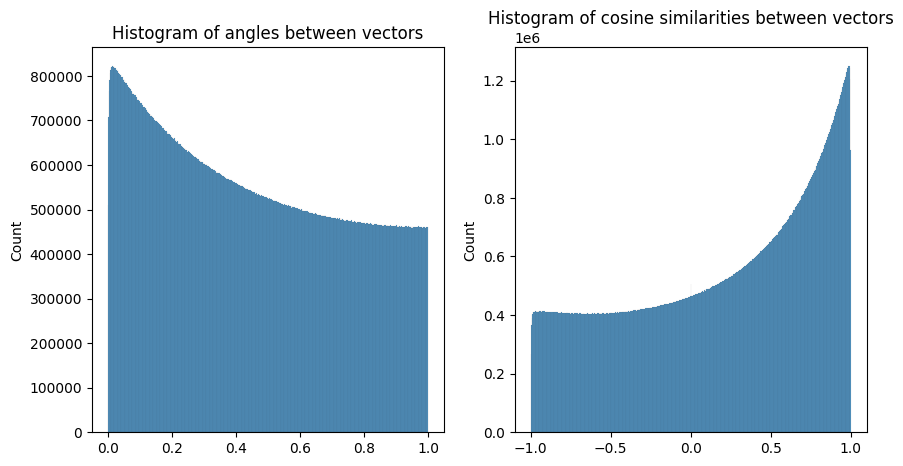

In [16]:
# comupte angles between vectors (all against all)
from scipy.spatial.distance import cosine

angles = np.zeros((all_coeffs.shape[0], all_coeffs.shape[0]))
for i in tqdm(range(all_coeffs.shape[0])):
    #for j in range(all_coeffs.shape[0]):
    #    angles[i,j] = np.arccos(1 - cosine(all_coeffs[i,:], all_coeffs[j,:]))
    angles[i,:] = 1 - np.abs(np.dot(all_coeffs, all_coeffs[i,:])/(np.linalg.norm(all_coeffs, axis=1)*np.linalg.norm(all_coeffs[i,:])))

# cosine similarity
all_coeffs_torch = torch.tensor(all_coeffs).float()

cos_sim = torch.zeros((all_coeffs.shape[0], all_coeffs.shape[0]))
for i in tqdm(range(all_coeffs.shape[0])):
    cos_sim[:,i] = torch.nn.functional.cosine_similarity(all_coeffs_torch, all_coeffs_torch[i,:].unsqueeze(0), dim=1).detach().cpu()
cos_sim

# plot a histogram of angles and cosine similarities
fig, ax = plt.subplots(1,2, figsize=(10,5))
sns.histplot(angles.flatten(), ax=ax[0])
ax[0].set_title('Histogram of angles between vectors')
sns.histplot(cos_sim.flatten(), ax=ax[1])
ax[1].set_title('Histogram of cosine similarities between vectors')
plt.show()

0.012789894987532661


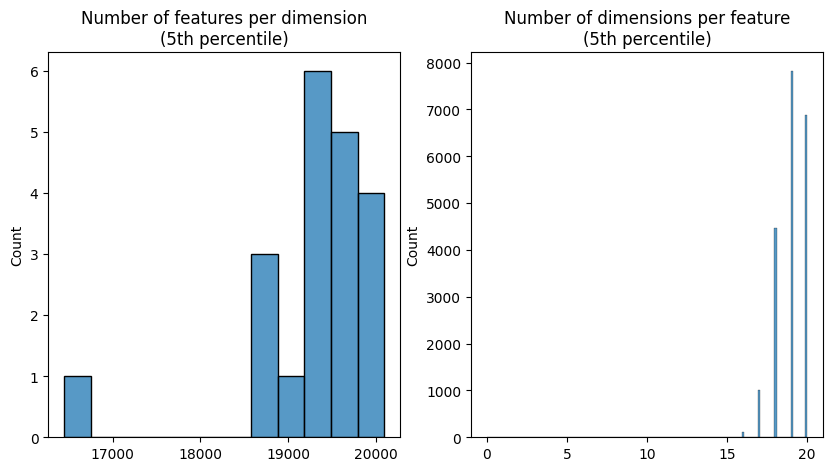

In [ ]:
all_coeffs_norm = all_coeffs / np.linalg.norm(all_coeffs, axis=1)[:,None]
if np.isnan(all_coeffs_norm).any():
    print('nan values in all_coeffs_norm')
    all_coeffs_norm[np.isnan(all_coeffs_norm)] = 0

# what is the 5th percentile
threshold = np.percentile(np.abs(all_coeffs_norm), 5)
print(threshold)

#threshold = 0.1
bool_superpositions = np.abs(all_coeffs_norm) > threshold
features_per_dim = np.sum(bool_superpositions, axis=0)
dims_per_feature = np.sum(bool_superpositions, axis=1)

# plot histograms of both next to each other
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(features_per_dim, ax=ax[0])
ax[0].set_title('Number of features per dimension\n(5th percentile)')
sns.histplot(dims_per_feature, ax=ax[1])
ax[1].set_title('Number of dimensions per feature\n(5th percentile)')
plt.show()

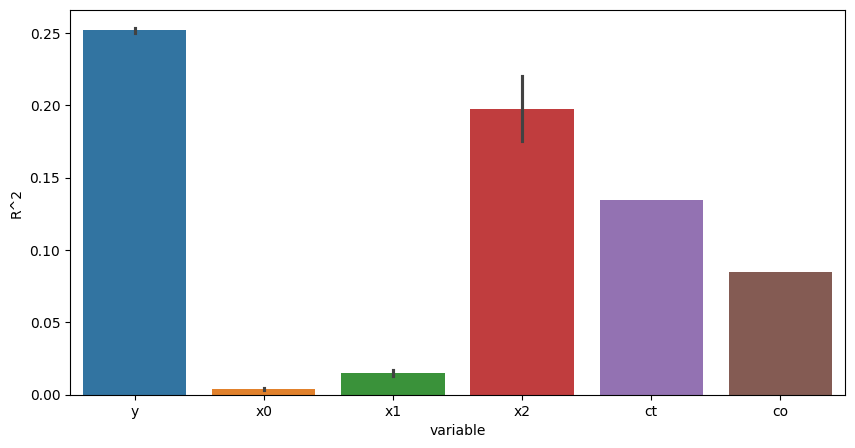

In [23]:
# plot average number of dimensions per feature and color by coeff_names

fig, ax = plt.subplots(1, 1, figsize=(10,5))
sns.barplot(x=coeff_names, y=all_fits, hue=coeff_names, ax=ax)
plt.ylabel('R^2')
plt.xlabel('variable')
plt.show()

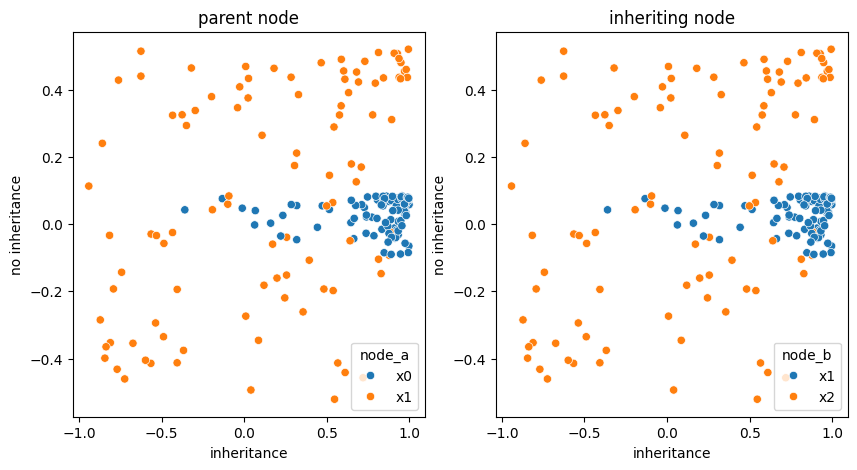

In [24]:
# calculate the cosine similarity between the same-index features from different x variables
# and compare them to all the other features

cos_sim_x_same = []
cos_sim_x_avgdiff = []
node_a = []
node_b = []
for i in range(x0_coeffs.shape[0]):
    temp_same = torch.nn.functional.cosine_similarity(torch.tensor(x0_coeffs[i,:]).unsqueeze(0).float(), torch.tensor(x1_coeffs[i,:]).unsqueeze(0).float(), dim=1).detach().cpu().item()
    temp_diff = torch.nn.functional.cosine_similarity(torch.tensor(x0_coeffs[~(np.arange(x0_coeffs.shape[0]) == i),:]).float(), torch.tensor(x1_coeffs[i,:]).float(), dim=1).detach().cpu().numpy().mean()
    cos_sim_x_same.append(temp_same)
    cos_sim_x_avgdiff.append(temp_diff)
    node_a.append('x0')
    node_b.append('x1')
    temp_same = torch.nn.functional.cosine_similarity(torch.tensor(x1_coeffs[i,:]).unsqueeze(0).float(), torch.tensor(x2_coeffs[i,:]).unsqueeze(0).float(), dim=1).detach().cpu().item()
    temp_diff = torch.nn.functional.cosine_similarity(torch.tensor(x1_coeffs[~(np.arange(x1_coeffs.shape[0]) == i),:]).float(), torch.tensor(x2_coeffs[i,:]).float(), dim=1).detach().cpu().numpy().mean()
    cos_sim_x_same.append(temp_same)
    cos_sim_x_avgdiff.append(temp_diff)
    node_a.append('x1')
    node_b.append('x2')

df_x_dependency = pd.DataFrame({
    'cos_sim_same': cos_sim_x_same,
    'cos_sim_avgdiff': cos_sim_x_avgdiff,
    'node_a': node_a,
    'node_b': node_b
})

# plot the cosine similarities
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.scatterplot(data=df_x_dependency, x='cos_sim_same', y='cos_sim_avgdiff', hue='node_a', ax=ax[0])
ax[0].set_title('parent node')
ax[0].set_xlabel('inheritance')
ax[0].set_ylabel('no inheritance')
sns.scatterplot(data=df_x_dependency, x='cos_sim_same', y='cos_sim_avgdiff', hue='node_b', ax=ax[1])
ax[1].set_title('inheriting node')
ax[1].set_xlabel('inheritance')
ax[1].set_ylabel('no inheritance')
plt.show()

## latent 150

In [5]:
# load encoder

#encoder = Encoder(20000, latent_dim, model_depth).to(device)
model_name = 'large_{}-complexity_{}-depth_{}-latent_{}-samples_0.1-dropout'.format(complexity, model_depth, latent_dim, n_samples)
encoder = torch.load('03_results/models/sim2_{}_encoder.pth'.format(model_name)).cpu()

encoder.eval()
reps = encoder(rna_counts).detach()

/tmp/ipykernel_1595651/254216243.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder = torch.load('03_results/models/sim2_{}_encoder.pth'.format(model_name)).cpu()


### tests

In [8]:
y_coeffs, y_fits = identify_superpositions(reps.cpu().detach().numpy(), rna_counts.cpu().detach().numpy())

100%|██████████| 20000/20000 [06:16<00:00, 53.16it/s]


In [11]:
# export the superposition coefficients (numpy)
np.save('03_results/reports/files/sim2_{}_y_coeffs.npy'.format(model_name), y_coeffs)

In [ ]:
x0_coeffs, x0_fits = identify_superpositions(reps.cpu().detach().numpy(), x0.cpu().detach().numpy())
x1_coeffs, x1_fits = identify_superpositions(reps.cpu().detach().numpy(), x1.cpu().detach().numpy())
x2_coeffs, x2_fits = identify_superpositions(reps.cpu().detach().numpy(), x2.cpu().detach().numpy())
ct_coeffs, ct_fits = identify_superpositions(reps.cpu().detach().numpy(), ct.unsqueeze(1).cpu().detach().numpy())
co_coeffs, co_fits = identify_superpositions(reps.cpu().detach().numpy(), co.unsqueeze(1).cpu().detach().numpy())

100%|██████████| 1/1 [00:00<00:00, 79.81it/s]


In [ ]:
all_coeffs = np.concatenate((x0_coeffs, x1_coeffs, x2_coeffs, ct_coeffs, co_coeffs), axis=0)
coeff_names = ['x0']*x0_coeffs.shape[0] + ['x1']*x1_coeffs.shape[0] + ['x2']*x2_coeffs.shape[0] + ['ct'] + ['co']
print(all_coeffs.shape)
print(len(coeff_names))

all_fits = np.concatenate((x0_fits, x1_fits, x2_fits, ct_fits, co_fits), axis=0)
print(all_fits.shape)

comparison_data = np.concatenate((x0.cpu().detach().numpy(), x1.cpu().detach().numpy(), x2.cpu().detach().numpy(), ct.unsqueeze(1).cpu().detach().numpy(), co.unsqueeze(1).cpu().detach().numpy()), axis=1).T

(20302,)


In [ ]:
# with y

all_coeffs = np.concatenate((y_coeffs, x0_coeffs, x1_coeffs, x2_coeffs, ct_coeffs, co_coeffs), axis=0)
coeff_names = ['y']*y_coeffs.shape[0] + ['x0']*x0_coeffs.shape[0] + ['x1']*x1_coeffs.shape[0] + ['x2']*x2_coeffs.shape[0] + ['ct'] + ['co']
print(all_coeffs.shape)
print(len(coeff_names))

all_fits = np.concatenate((y_fits, x0_fits, x1_fits, x2_fits, ct_fits, co_fits), axis=0)
print(all_fits.shape)

comparison_data = np.concatenate((rna_counts.cpu().detach().numpy(), x0.cpu().detach().numpy(), x1.cpu().detach().numpy(), x2.cpu().detach().numpy(), ct.unsqueeze(1).cpu().detach().numpy(), co.unsqueeze(1).cpu().detach().numpy()), axis=1).T

### calculate angles

In [30]:
# comupte angles between vectors (all against all)
from scipy.spatial.distance import cosine

angles = np.zeros((all_coeffs.shape[0], all_coeffs.shape[0]))
for i in tqdm(range(all_coeffs.shape[0])):
    #for j in range(all_coeffs.shape[0]):
    #    angles[i,j] = np.arccos(1 - cosine(all_coeffs[i,:], all_coeffs[j,:]))
    angles[i,:] = 1 - np.abs(np.dot(all_coeffs, all_coeffs[i,:])/(np.linalg.norm(all_coeffs, axis=1)*np.linalg.norm(all_coeffs[i,:])))

  0%|          | 0/20302 [00:00<?, ?it/s]/tmp/ipykernel_1595651/3896569317.py:8: RuntimeWarning: invalid value encountered in divide
  angles[i,:] = 1 - np.abs(np.dot(all_coeffs, all_coeffs[i,:])/(np.linalg.norm(all_coeffs, axis=1)*np.linalg.norm(all_coeffs[i,:])))
100%|██████████| 20302/20302 [01:23<00:00, 242.01it/s]


In [31]:
angles

array([[0.00000000e+00, 8.23205233e-03, 3.06328415e-02, ...,
        2.49119789e-02, 2.20897169e-02, 2.12714112e-02],
       [8.23205233e-03, 1.11022302e-16, 6.83893962e-02, ...,
        4.58009486e-03, 3.39552315e-03, 3.06016358e-03],
       [3.06328415e-02, 6.83893962e-02, 0.00000000e+00, ...,
        1.07067756e-01, 1.00053629e-01, 9.91603616e-02],
       ...,
       [2.49119789e-02, 4.58009486e-03, 1.07067756e-01, ...,
        7.77156117e-16, 2.96533229e-04, 1.96760692e-04],
       [2.20897169e-02, 3.39552315e-03, 1.00053629e-01, ...,
        2.96533229e-04, 0.00000000e+00, 6.18346336e-05],
       [2.12714112e-02, 3.06016358e-03, 9.91603616e-02, ...,
        1.96760692e-04, 6.18346336e-05, 0.00000000e+00]])

In [32]:
# cosine similarity
all_coeffs_torch = torch.tensor(all_coeffs).float()

cos_sim = torch.zeros((all_coeffs.shape[0], all_coeffs.shape[0]))
for i in range(all_coeffs.shape[0]):
    cos_sim[:,i] = torch.nn.functional.cosine_similarity(all_coeffs_torch, all_coeffs_torch[i,:].unsqueeze(0), dim=1).detach().cpu()
cos_sim

tensor([[1.0000, 0.9918, 0.9694,  ..., 0.9751, 0.9779, 0.9787],
        [0.9918, 1.0000, 0.9316,  ..., 0.9954, 0.9966, 0.9969],
        [0.9694, 0.9316, 1.0000,  ..., 0.8929, 0.8999, 0.9008],
        ...,
        [0.9751, 0.9954, 0.8929,  ..., 1.0000, 0.9997, 0.9998],
        [0.9779, 0.9966, 0.8999,  ..., 0.9997, 1.0000, 0.9999],
        [0.9787, 0.9969, 0.9008,  ..., 0.9998, 0.9999, 1.0000]])

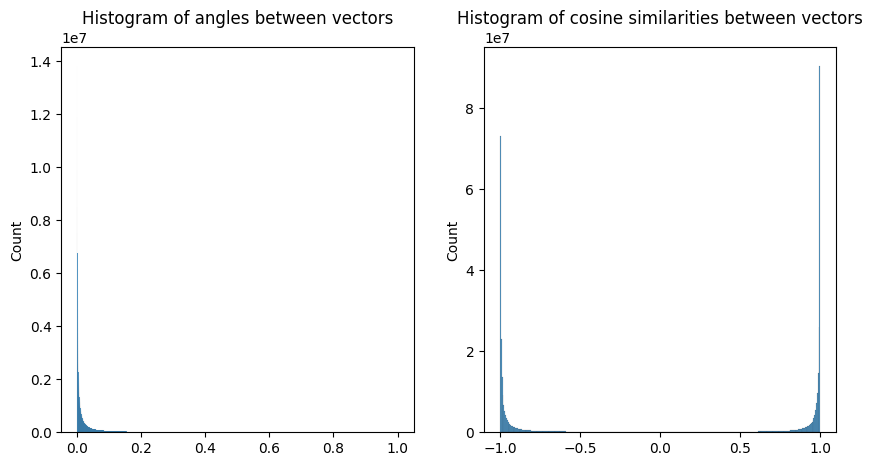

In [33]:
# plot a histogram of angles and cosine similarities
# including y

fig, ax = plt.subplots(1,2, figsize=(10,5))
sns.histplot(angles.flatten(), ax=ax[0])
ax[0].set_title('Histogram of angles between vectors')
sns.histplot(cos_sim.flatten(), ax=ax[1])
ax[1].set_title('Histogram of cosine similarities between vectors')
plt.show()

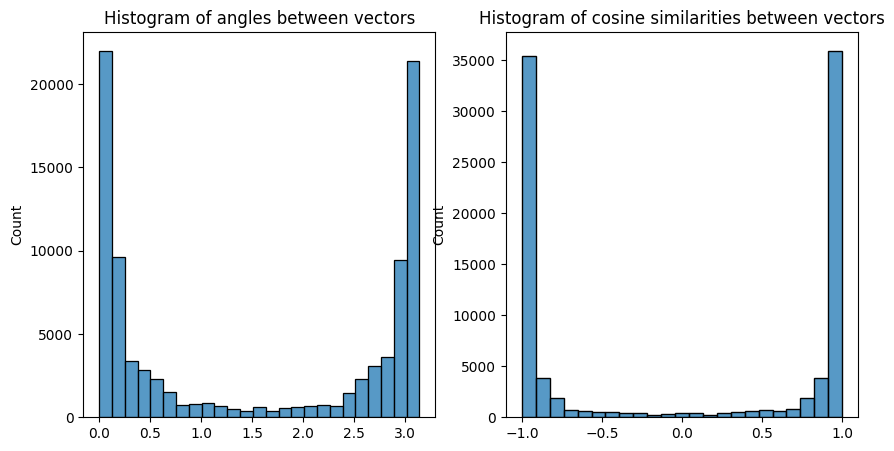

In [14]:
# plot a histogram of angles and cosine similarities

fig, ax = plt.subplots(1,2, figsize=(10,5))
sns.histplot(angles.flatten(), ax=ax[0])
ax[0].set_title('Histogram of angles between vectors')
sns.histplot(cos_sim.flatten(), ax=ax[1])
ax[1].set_title('Histogram of cosine similarities between vectors')
plt.show()

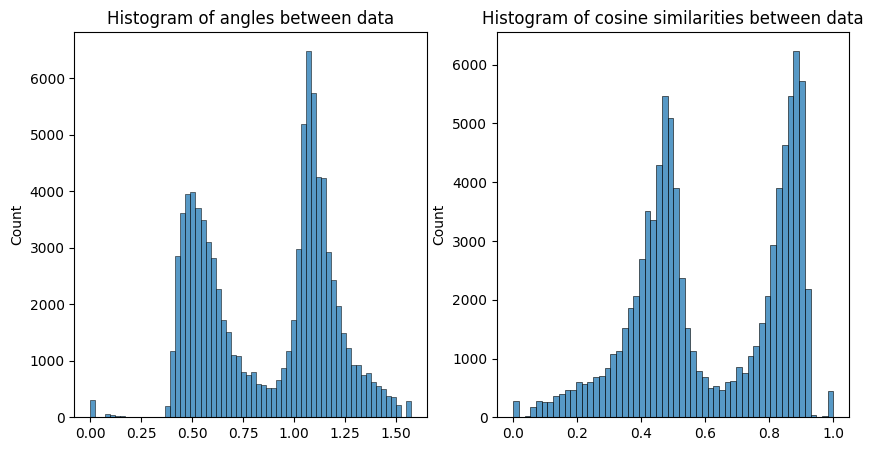

In [15]:
angles_comparison = np.zeros((comparison_data.shape[0], comparison_data.shape[0]))
for i in range(comparison_data.shape[0]):
    for j in range(comparison_data.shape[0]):
        angles_comparison[i,j] = np.arccos(1 - cosine(comparison_data[i,:], comparison_data[j,:]))

cos_sim_comparison = torch.zeros((comparison_data.shape[0], comparison_data.shape[0]))
comparison_data_torch = torch.tensor(comparison_data).float()
for i in range(comparison_data.shape[0]):
    cos_sim_comparison[:,i] = torch.nn.functional.cosine_similarity(comparison_data_torch, comparison_data_torch[i,:].unsqueeze(0), dim=1).detach().cpu()

fig, ax = plt.subplots(1,2, figsize=(10,5))
sns.histplot(angles_comparison.flatten(), ax=ax[0])
ax[0].set_title('Histogram of angles between data')
sns.histplot(cos_sim_comparison.flatten(), ax=ax[1])
ax[1].set_title('Histogram of cosine similarities between data')
plt.show()

In [16]:
col_labels = np.repeat(coeff_names, all_coeffs.shape[0]).flatten()
row_labels = np.tile(coeff_names, all_coeffs.shape[0]).flatten()
same_labels = col_labels == row_labels
same_label_colors = np.where(same_labels, 'same', 'different')
print(same_label_colors)

['same' 'same' 'same' ... 'different' 'different' 'same']


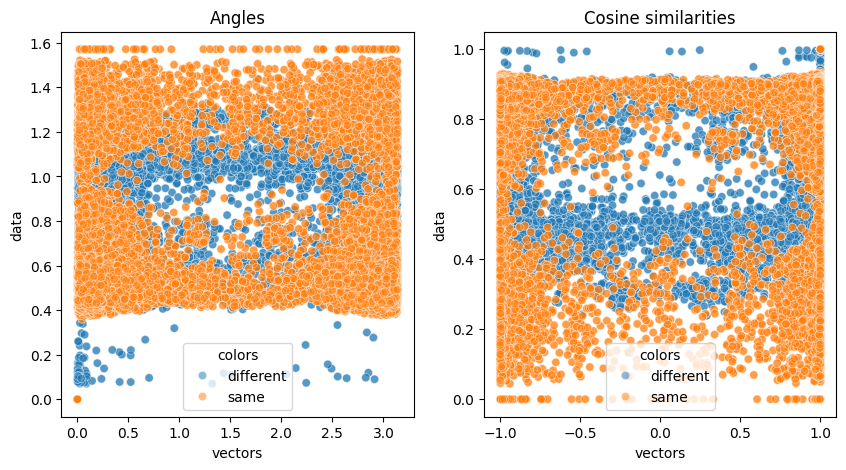

In [17]:
# plot angles against comparison angles and cosine similarities against comparison cosine similarities

df_comparison = pd.DataFrame({
    'angles_rep': angles.flatten(),
    'cos_sim_rep': cos_sim.flatten(),
    'angles': angles_comparison.flatten(),
    'cos_sim': cos_sim_comparison.flatten(),
    'colors': same_label_colors
})

fig, ax = plt.subplots(1,2, figsize=(10,5))
sns.scatterplot(data=df_comparison.sort_values(by='colors'), x='angles_rep', y='angles', hue='colors', ax=ax[0], alpha=0.5)
ax[0].set_title('Angles')
ax[0].set_xlabel('vectors')
ax[0].set_ylabel('data')
sns.scatterplot(data=df_comparison.sort_values(by='colors'), x='cos_sim_rep', y='cos_sim', hue='colors', ax=ax[1], alpha=0.5)
ax[1].set_title('Cosine similarities')
ax[1].set_xlabel('vectors')
ax[1].set_ylabel('data')
plt.show()

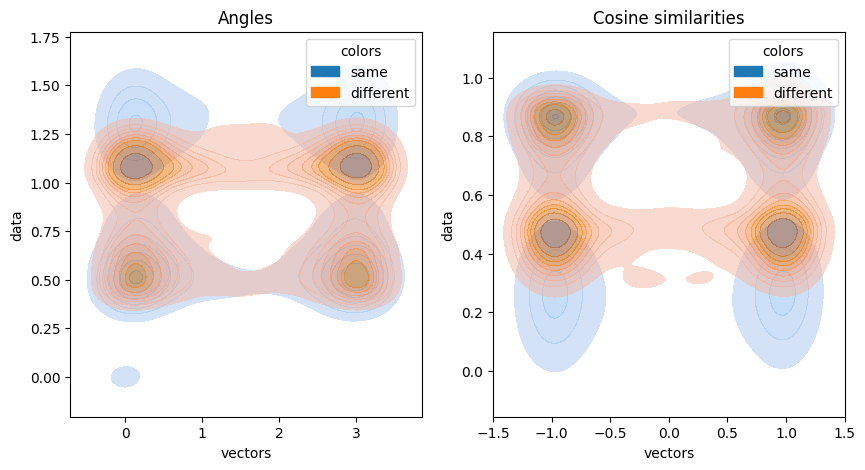

In [18]:
# make this a density plot

fig, ax = plt.subplots(1,2, figsize=(10,5))
sns.kdeplot(data=df_comparison, x='angles_rep', y='angles', hue='colors', ax=ax[0], fill=True, alpha=0.5)
ax[0].set_title('Angles')
ax[0].set_xlabel('vectors')
ax[0].set_ylabel('data')
sns.kdeplot(data=df_comparison, x='cos_sim_rep', y='cos_sim', hue='colors', ax=ax[1], fill=True, alpha=0.5)
ax[1].set_title('Cosine similarities')
ax[1].set_xlabel('vectors')
ax[1].set_ylabel('data')
plt.show()

In [19]:
# get the upper triangles of angles and cos_sim and flatten them

angles_upper = np.triu(angles, k=1)
# set the lower triangle to NaN
angles_upper[np.tril_indices(angles_upper.shape[0])] = np.nan
angles_upper = angles_upper.flatten()
lower_tri_indices = ~np.isnan(angles_upper)
# keep only the non-NaN values
angles_upper = angles_upper[~np.isnan(angles_upper)]
print(angles_upper)

cos_sim_upper = np.triu(cos_sim, k=1)
# set the lower triangle to NaN
cos_sim_upper[np.tril_indices(cos_sim_upper.shape[0])] = np.nan
cos_sim_upper = cos_sim_upper.flatten()
# keep only the non-NaN values
cos_sim_upper = cos_sim_upper[~np.isnan(cos_sim_upper)]
print(cos_sim_upper)

# get the labels of which variables these are (from x and y axis)
col_labels = np.repeat(coeff_names, all_coeffs.shape[0])[lower_tri_indices]
row_labels = np.tile(coeff_names, all_coeffs.shape[0])[lower_tri_indices]
print(col_labels)
print(row_labels)

[0.1593748  2.67049171 0.25919957 ... 0.02435356 0.0198377  0.01112073]
[ 0.9873267  -0.891069    0.9665954  ...  0.9997036   0.99980336
  0.99993825]
['x0' 'x0' 'x0' ... 'x2' 'x2' 'ct']
['x0' 'x0' 'x0' ... 'ct' 'co' 'co']


In [20]:
# plot the angles and cosine similarities
# now make it 2 plots and color by the labels

df_geometry = pd.DataFrame({
    'angles': angles_upper, 
    'cos_sim': cos_sim_upper, 
    'col_labels': col_labels, 
    'row_labels': row_labels
    })

df_geometry['x0'] = [1 if 'x0' in x else 0 for x in df_geometry['col_labels']]
df_geometry['x0'] = [1 if 'x0' in x else df_geometry['x0'].values[i] for i, x in enumerate(df_geometry['row_labels'])]
df_geometry['x1'] = [1 if 'x1' in x else 0 for x in df_geometry['col_labels']]
df_geometry['x1'] = [1 if 'x1' in x else df_geometry['x1'].values[i] for i, x in enumerate(df_geometry['row_labels'])]
df_geometry['x2'] = [1 if 'x2' in x else 0 for x in df_geometry['col_labels']]
df_geometry['x2'] = [1 if 'x2' in x else df_geometry['x2'].values[i] for i, x in enumerate(df_geometry['row_labels'])]
df_geometry['ct'] = [1 if 'ct' in x else 0 for x in df_geometry['col_labels']]
df_geometry['ct'] = [1 if 'ct' in x else df_geometry['ct'].values[i] for i, x in enumerate(df_geometry['row_labels'])]
df_geometry['co'] = [1 if 'co' in x else 0 for x in df_geometry['col_labels']]
df_geometry['co'] = [1 if 'co' in x else df_geometry['co'].values[i] for i, x in enumerate(df_geometry['row_labels'])]
df_geometry['same'] = [1 if x == y else 0 for x, y in zip(df_geometry['col_labels'], df_geometry['row_labels'])]

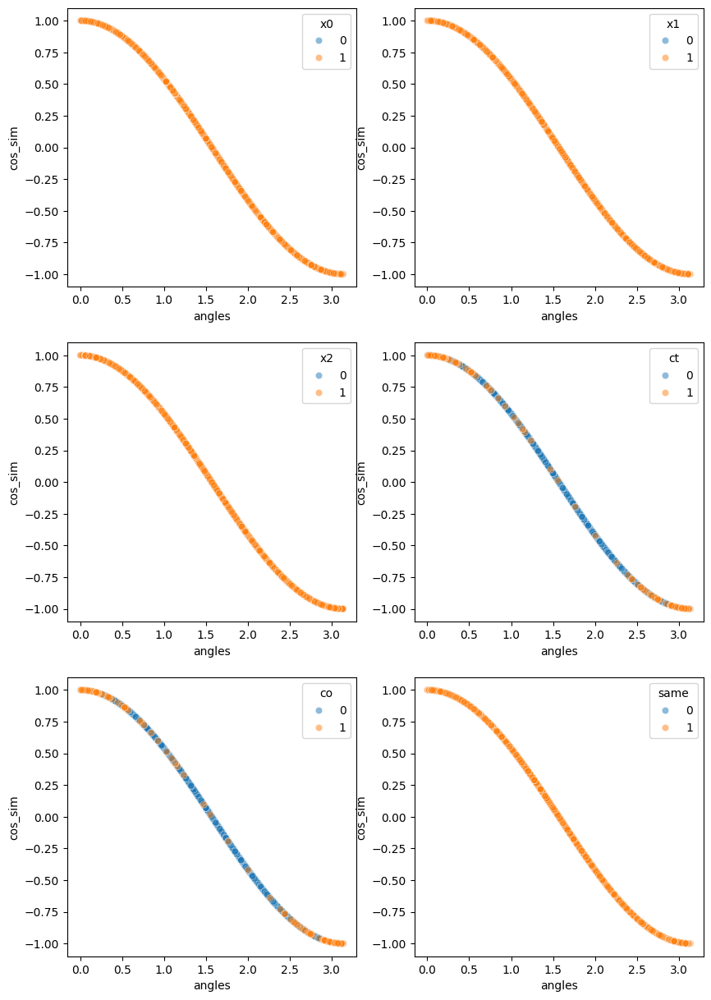

In [21]:
# plot the angles and cosine similarities against each other and color by each variable
fig, ax = plt.subplots(3, 2, figsize=(10,15))
sns.scatterplot(data=df_geometry.sort_values('x0'), x='angles', y='cos_sim', hue='x0', ax=ax[0,0], alpha=0.5)
sns.scatterplot(data=df_geometry.sort_values('x1'), x='angles', y='cos_sim', hue='x1', ax=ax[0,1], alpha=0.5)
sns.scatterplot(data=df_geometry.sort_values('x2'), x='angles', y='cos_sim', hue='x2', ax=ax[1,0], alpha=0.5)
sns.scatterplot(data=df_geometry.sort_values('ct'), x='angles', y='cos_sim', hue='ct', ax=ax[1,1], alpha=0.5)
sns.scatterplot(data=df_geometry.sort_values('co'), x='angles', y='cos_sim', hue='co', ax=ax[2,0], alpha=0.5)
sns.scatterplot(data=df_geometry.sort_values('same'), x='angles', y='cos_sim', hue='same', ax=ax[2,1], alpha=0.5)
plt.show()

### geometry from cosine sim

In [ ]:
# cosine similarity
all_coeffs_torch = torch.tensor(all_coeffs).float()

cos_sim = torch.zeros((all_coeffs.shape[0], all_coeffs.shape[0]))
for i in range(all_coeffs.shape[0]):
    cos_sim[:,i] = torch.nn.functional.cosine_similarity(all_coeffs_torch, all_coeffs_torch[i,:].unsqueeze(0), dim=1).detach().cpu()
cos_sim

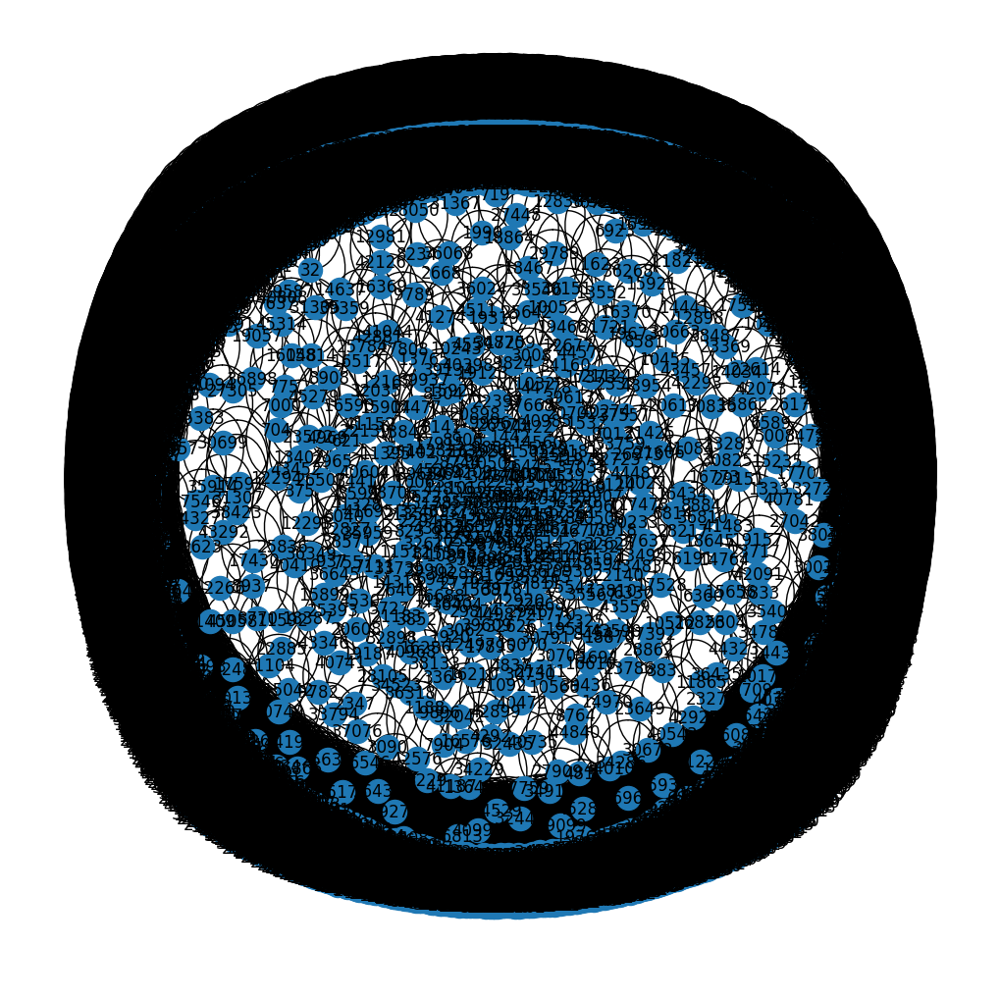

In [ ]:
# create a graph based on the cosine similarities

"""
import networkx as nx

G = nx.Graph()

unique_labels = ['x0', 'x1', 'x2', 'ct', 'co']
color_options = ['red', 'blue', 'green', 'yellow', 'purple']
for i in range(df_geometry.shape[0]):
    if (df_geometry['cos_sim'].values[i] > 0.5) or (df_geometry['angles'].values[i] < -0.5):
        G.add_node(i, label=df_geometry['col_labels'].values[i], color=color_options[unique_labels.index(df_geometry['col_labels'].values[i])])
        G.add_node(i, label=df_geometry['row_labels'].values[i], color=color_options[unique_labels.index(df_geometry['row_labels'].values[i])])
        G.add_edge(i, i, weight=df_geometry['cos_sim'].values[i])

# plot the graph and color nodes by label
pos = nx.spring_layout(G)
plt.figure(figsize=(10,10))
nx.draw(G, pos, with_labels=True)
plt.show()
"""

### calculate number of features per latent dimension

In [36]:
all_coeffs_norm = all_coeffs / np.linalg.norm(all_coeffs, axis=1)[:,None]
all_coeffs_norm
# replace nan values with 0
all_coeffs_norm[np.isnan(all_coeffs_norm)] = 0

/tmp/ipykernel_1595651/4021975753.py:1: RuntimeWarning: invalid value encountered in divide
  all_coeffs_norm = all_coeffs / np.linalg.norm(all_coeffs, axis=1)[:,None]


In [37]:
# what is the 5th percentile
threshold = np.percentile(np.abs(all_coeffs_norm), 5)
threshold

0.002879529940998539

In [38]:
#threshold = 0.1
bool_superpositions = np.abs(all_coeffs_norm) > threshold
features_per_dim = np.sum(bool_superpositions, axis=0)
dims_per_feature = np.sum(bool_superpositions, axis=1)

In [39]:
# how many dims have no feature?
no_feature_dims = np.sum(features_per_dim == 0)
print(no_feature_dims)

0


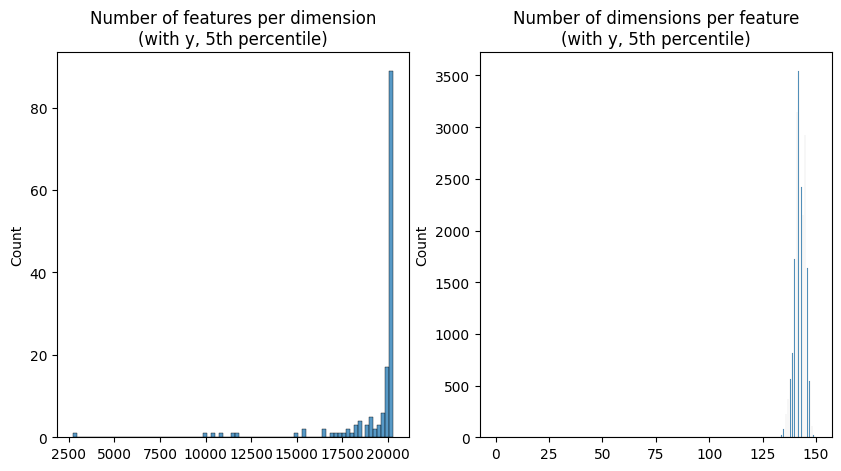

In [41]:
# plot histograms of both next to each other

fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(features_per_dim, ax=ax[0])
ax[0].set_title('Number of features per dimension\n(with y, 5th percentile)')
sns.histplot(dims_per_feature, ax=ax[1])
ax[1].set_title('Number of dimensions per feature\n(with y, 5th percentile)')
plt.show()

In [43]:
dims_per_feature.shape

(20302,)

In [44]:
all_fits.shape

(20302,)

In [46]:
len(coeff_names)

602

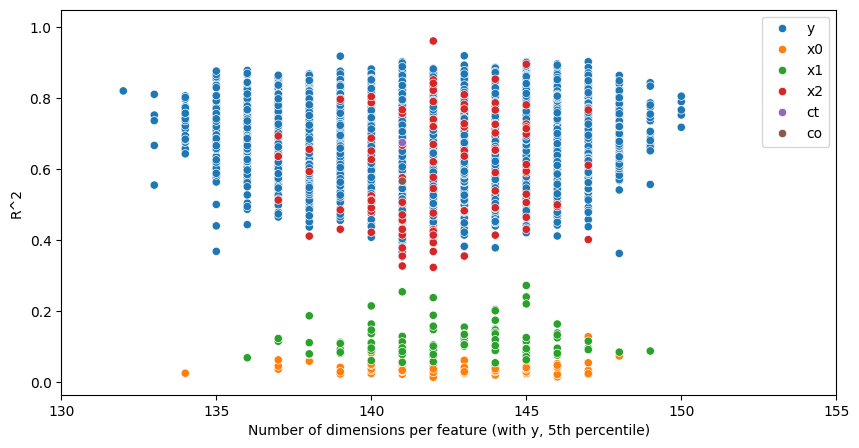

In [50]:
# plot fits against dimensions per feature and color by coeff_names

fig, ax = plt.subplots(1, 1, figsize=(10,5))
sns.scatterplot(x=dims_per_feature, y=all_fits, hue=coeff_names, ax=ax)
plt.ylabel('R^2')
plt.xlabel('Number of dimensions per feature (with y, 5th percentile)')
plt.xlim(130, 155)
plt.show()

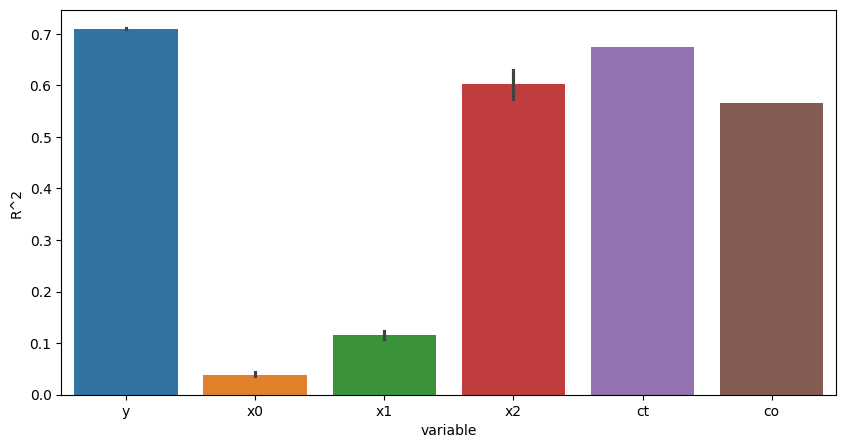

In [55]:
# plot average number of dimensions per feature and color by coeff_names

fig, ax = plt.subplots(1, 1, figsize=(10,5))
sns.barplot(x=coeff_names, y=all_fits, hue=coeff_names, ax=ax)
plt.ylabel('R^2')
plt.xlabel('variable')
plt.show()

0.053133792189004894


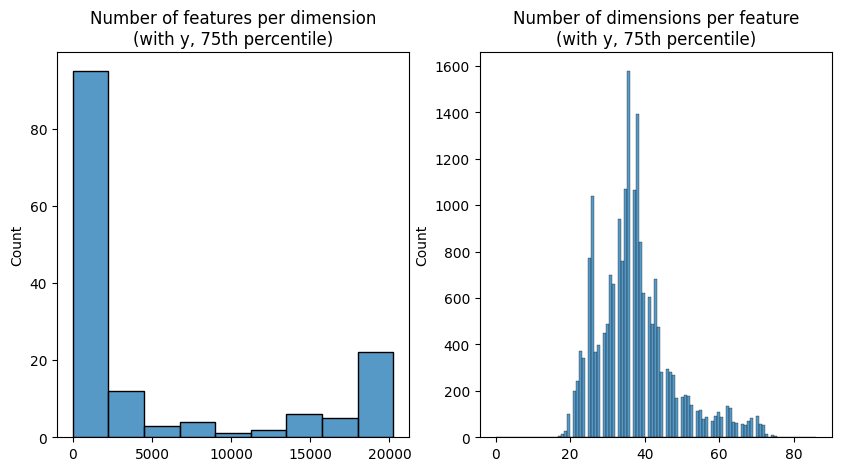

In [57]:
# what is the 5th percentile
threshold = np.percentile(np.abs(all_coeffs_norm), 75)
print(threshold)

#threshold = 0.1
bool_superpositions = np.abs(all_coeffs_norm) > threshold
features_per_dim = np.sum(bool_superpositions, axis=0)
dims_per_feature = np.sum(bool_superpositions, axis=1)

# plot histograms of both next to each other
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(features_per_dim, ax=ax[0])
ax[0].set_title('Number of features per dimension\n(with y, 75th percentile)')
sns.histplot(dims_per_feature, ax=ax[1])
ax[1].set_title('Number of dimensions per feature\n(with y, 75th percentile)')
plt.show()

0.10044464773036031


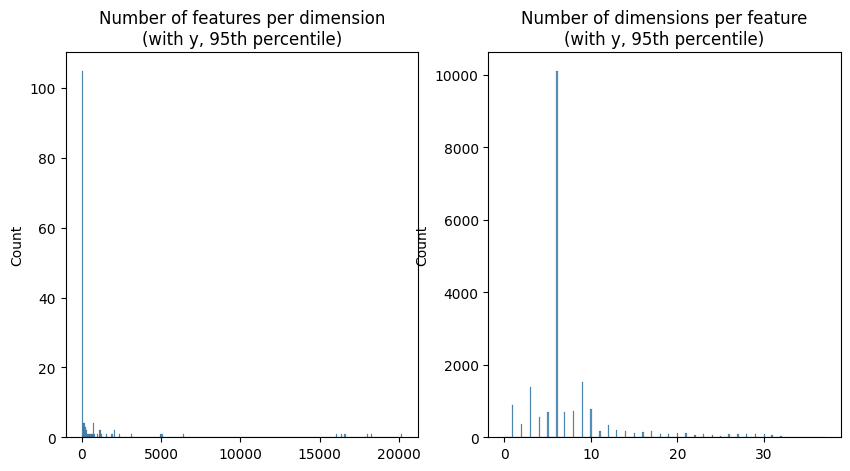

In [58]:
# what is the 5th percentile
threshold = np.percentile(np.abs(all_coeffs_norm), 95)
print(threshold)

#threshold = 0.1
bool_superpositions = np.abs(all_coeffs_norm) > threshold
features_per_dim = np.sum(bool_superpositions, axis=0)
dims_per_feature = np.sum(bool_superpositions, axis=1)

# plot histograms of both next to each other
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(features_per_dim, ax=ax[0])
ax[0].set_title('Number of features per dimension\n(with y, 95th percentile)')
sns.histplot(dims_per_feature, ax=ax[1])
ax[1].set_title('Number of dimensions per feature\n(with y, 95th percentile)')
plt.show()

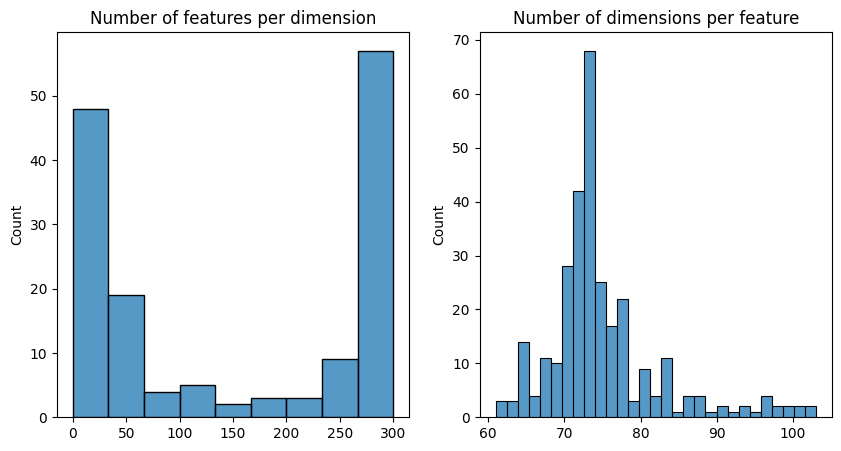

In [47]:
# plot histograms of both next to each other

fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(features_per_dim, ax=ax[0])
ax[0].set_title('Number of features per dimension')
sns.histplot(dims_per_feature, ax=ax[1])
ax[1].set_title('Number of dimensions per feature')
plt.show()

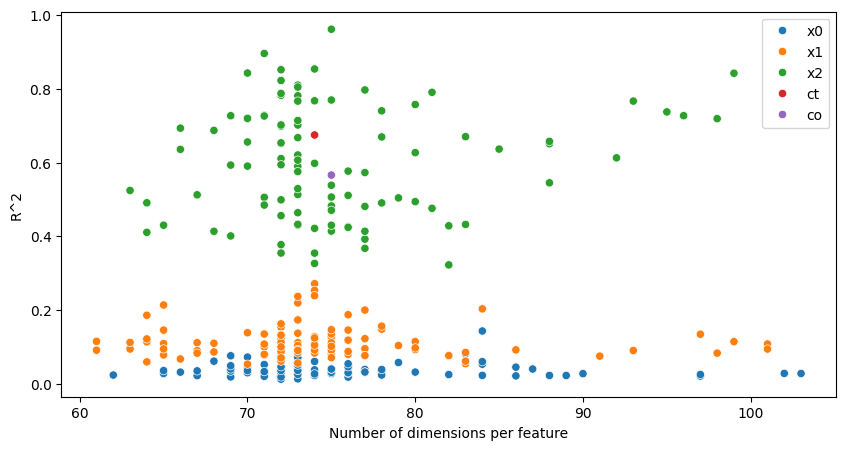

In [48]:
# plot fits against dimensions per feature and color by coeff_names

fig, ax = plt.subplots(1, 1, figsize=(10,5))
sns.scatterplot(x=dims_per_feature, y=all_fits, hue=coeff_names, ax=ax)
plt.ylabel('R^2')
plt.xlabel('Number of dimensions per feature')
plt.show()

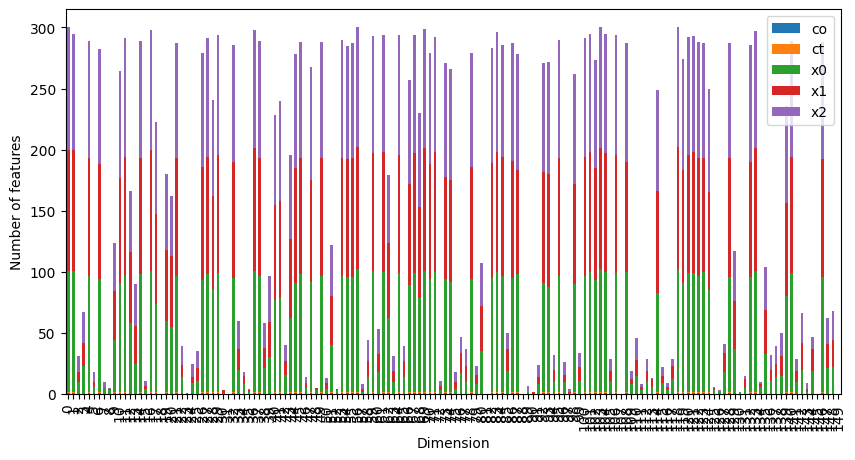

In [64]:
# plot fits against dimensions per feature and color by coeff_names

# make a stacked bar plot of the number of features per dimension colored by the coeff_names
df_features_per_dim = pd.DataFrame(bool_superpositions.astype(int).T, columns=coeff_names, index=range(bool_superpositions.shape[1]))
# get it to a format of counts per same column name
df_features_per_dim = df_features_per_dim.groupby(level=0, axis=1).sum()
#print(df_features_per_dim)

fig, ax = plt.subplots(1, 1, figsize=(10,5))
df_features_per_dim.plot(kind='bar', stacked=True, ax=ax)
plt.ylabel('Number of features')
plt.xlabel('Dimension')
plt.show()

### causality

In [26]:
# calculate the cosine similarity between the same-index features from different x variables
# and compare them to all the other features

cos_sim_x_same = []
cos_sim_x_avgdiff = []
node_a = []
node_b = []
for i in range(x0_coeffs.shape[0]):
    temp_same = torch.nn.functional.cosine_similarity(torch.tensor(x0_coeffs[i,:]).unsqueeze(0).float(), torch.tensor(x1_coeffs[i,:]).unsqueeze(0).float(), dim=1).detach().cpu().item()
    temp_diff = torch.nn.functional.cosine_similarity(torch.tensor(x0_coeffs[~(np.arange(x0_coeffs.shape[0]) == i),:]).float(), torch.tensor(x1_coeffs[i,:]).float(), dim=1).detach().cpu().numpy().mean()
    cos_sim_x_same.append(temp_same)
    cos_sim_x_avgdiff.append(temp_diff)
    node_a.append('x0')
    node_b.append('x1')
    temp_same = torch.nn.functional.cosine_similarity(torch.tensor(x1_coeffs[i,:]).unsqueeze(0).float(), torch.tensor(x2_coeffs[i,:]).unsqueeze(0).float(), dim=1).detach().cpu().item()
    temp_diff = torch.nn.functional.cosine_similarity(torch.tensor(x1_coeffs[~(np.arange(x1_coeffs.shape[0]) == i),:]).float(), torch.tensor(x2_coeffs[i,:]).float(), dim=1).detach().cpu().numpy().mean()
    cos_sim_x_same.append(temp_same)
    cos_sim_x_avgdiff.append(temp_diff)
    node_a.append('x1')
    node_b.append('x2')

df_x_dependency = pd.DataFrame({
    'cos_sim_same': cos_sim_x_same,
    'cos_sim_avgdiff': cos_sim_x_avgdiff,
    'node_a': node_a,
    'node_b': node_b
})
df_x_dependency

,cos_sim_same,cos_sim_avgdiff,node_a,node_b
0,-0.976333,-0.066184,x0,x1
1,0.980171,0.266362,x1,x2
2,0.999582,0.066196,x0,x1
3,-0.999120,0.281049,x1,x2
4,0.968728,-0.086113,x0,x1
...,...,...,...,...
195,0.549698,0.200818,x1,x2
196,0.246798,-0.075434,x0,x1
197,0.983544,0.259919,x1,x2
198,0.996221,0.065992,x0,x1


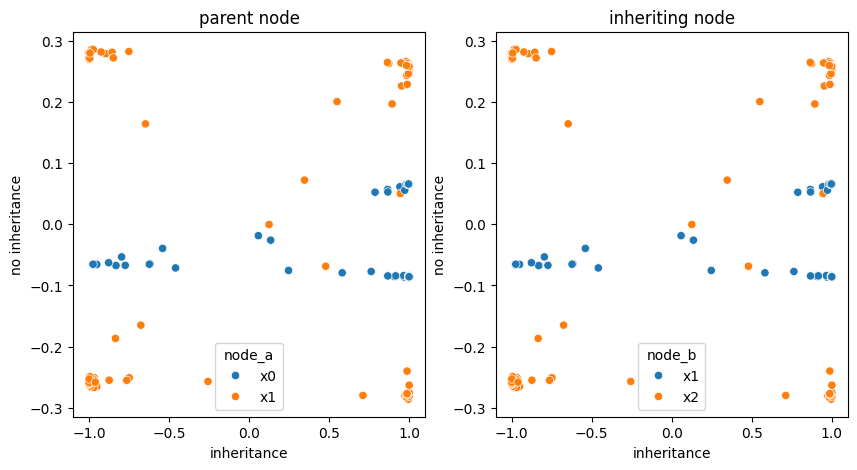

In [27]:
# plot the cosine similarities
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.scatterplot(data=df_x_dependency, x='cos_sim_same', y='cos_sim_avgdiff', hue='node_a', ax=ax[0])
ax[0].set_title('parent node')
ax[0].set_xlabel('inheritance')
ax[0].set_ylabel('no inheritance')
sns.scatterplot(data=df_x_dependency, x='cos_sim_same', y='cos_sim_avgdiff', hue='node_b', ax=ax[1])
ax[1].set_title('inheriting node')
ax[1].set_xlabel('inheritance')
ax[1].set_ylabel('no inheritance')
plt.show()

## latent 1000

In [25]:
latent_dim = 1000

# load encoder

#encoder = Encoder(20000, latent_dim, model_depth).to(device)
model_name = 'large_high-complexity_2-depth_{}-latent_0.1-dropout_100000-samples'.format(latent_dim)
encoder = torch.load('03_results/models/sim2_{}_encoder.pth'.format(model_name)).cpu()

encoder.eval()
reps = encoder(rna_counts).detach()

/tmp/ipykernel_1613858/3568928584.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder = torch.load('03_results/models/sim2_{}_encoder.pth'.format(model_name)).cpu()


In [26]:
use_y = True

if use_y:
    y_coeffs, y_fits = identify_superpositions(reps.cpu().detach().numpy(), rna_counts.cpu().detach().numpy())
x0_coeffs, x0_fits = identify_superpositions(reps.cpu().detach().numpy(), x0.cpu().detach().numpy())
x1_coeffs, x1_fits = identify_superpositions(reps.cpu().detach().numpy(), x1.cpu().detach().numpy())
x2_coeffs, x2_fits = identify_superpositions(reps.cpu().detach().numpy(), x2.cpu().detach().numpy())
ct_coeffs, ct_fits = identify_superpositions(reps.cpu().detach().numpy(), ct.unsqueeze(1).cpu().detach().numpy())
co_coeffs, co_fits = identify_superpositions(reps.cpu().detach().numpy(), co.unsqueeze(1).cpu().detach().numpy())

if use_y:
    all_coeffs = np.concatenate((y_coeffs, x0_coeffs, x1_coeffs, x2_coeffs, ct_coeffs, co_coeffs), axis=0)
    all_fits = np.concatenate((y_fits, x0_fits, x1_fits, x2_fits, ct_fits, co_fits), axis=0)
    coeff_names = ['y']*y_coeffs.shape[0] + ['x0']*x0_coeffs.shape[0] + ['x1']*x1_coeffs.shape[0] + ['x2']*x2_coeffs.shape[0] + ['ct'] + ['co']
    comparison_data = np.concatenate((rna_counts.cpu().detach().numpy(), x0.cpu().detach().numpy(), x1.cpu().detach().numpy(), x2.cpu().detach().numpy(), ct.unsqueeze(1).cpu().detach().numpy(), co.unsqueeze(1).cpu().detach().numpy()), axis=1).T
else:
    all_coeffs = np.concatenate((x0_coeffs, x1_coeffs, x2_coeffs, ct_coeffs, co_coeffs), axis=0)
    coeff_names = ['x0']*x0_coeffs.shape[0] + ['x1']*x1_coeffs.shape[0] + ['x2']*x2_coeffs.shape[0] + ['ct'] + ['co']
    all_fits = np.concatenate((x0_fits, x1_fits, x2_fits, ct_fits, co_fits), axis=0)
    comparison_data = np.concatenate((x0.cpu().detach().numpy(), x1.cpu().detach().numpy(), x2.cpu().detach().numpy(), ct.unsqueeze(1).cpu().detach().numpy(), co.unsqueeze(1).cpu().detach().numpy()), axis=1).T

print(all_coeffs.shape)
print(len(coeff_names))
print(all_fits.shape)
print(comparison_data.shape)

100%|██████████| 1/1 [00:00<00:00,  5.68it/s]


(20302, 1000)
20302
(20302,)
(20302, 1000)


In [31]:
# export the superposition coefficients (numpy)
np.save('03_results/reports/files/sim2_{}_y_coeffs.npy'.format(model_name), y_coeffs)

  0%|          | 0/20302 [00:00<?, ?it/s]/tmp/ipykernel_1613858/338624153.py:8: RuntimeWarning: invalid value encountered in divide
  angles[i,:] = 1 - np.abs(np.dot(all_coeffs, all_coeffs[i,:])/(np.linalg.norm(all_coeffs, axis=1)*np.linalg.norm(all_coeffs[i,:])))
100%|██████████| 20302/20302 [02:45<00:00, 122.43it/s]


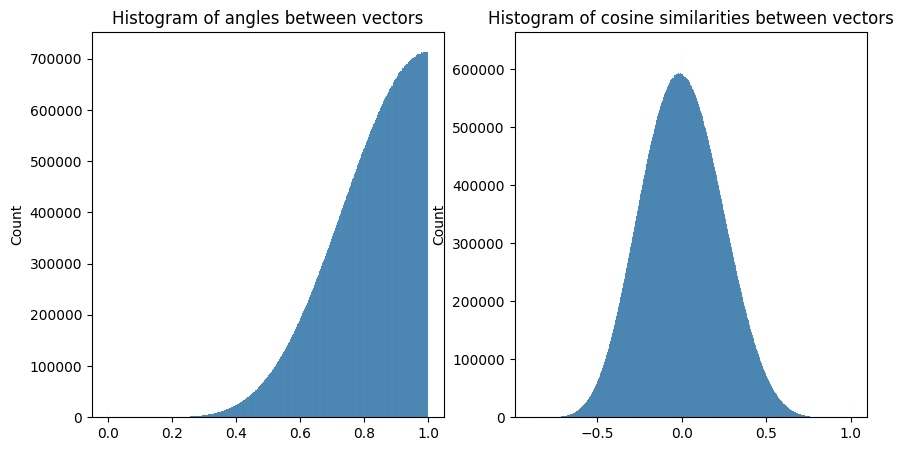

In [27]:
# comupte angles between vectors (all against all)
from scipy.spatial.distance import cosine

angles = np.zeros((all_coeffs.shape[0], all_coeffs.shape[0]))
for i in tqdm(range(all_coeffs.shape[0])):
    #for j in range(all_coeffs.shape[0]):
    #    angles[i,j] = np.arccos(1 - cosine(all_coeffs[i,:], all_coeffs[j,:]))
    angles[i,:] = 1 - np.abs(np.dot(all_coeffs, all_coeffs[i,:])/(np.linalg.norm(all_coeffs, axis=1)*np.linalg.norm(all_coeffs[i,:])))

# cosine similarity
all_coeffs_torch = torch.tensor(all_coeffs).float()

cos_sim = torch.zeros((all_coeffs.shape[0], all_coeffs.shape[0]))
for i in tqdm(range(all_coeffs.shape[0])):
    cos_sim[:,i] = torch.nn.functional.cosine_similarity(all_coeffs_torch, all_coeffs_torch[i,:].unsqueeze(0), dim=1).detach().cpu()
cos_sim

# plot a histogram of angles and cosine similarities
fig, ax = plt.subplots(1,2, figsize=(10,5))
sns.histplot(angles.flatten(), ax=ax[0])
ax[0].set_title('Histogram of angles between vectors')
sns.histplot(cos_sim.flatten(), ax=ax[1])
ax[1].set_title('Histogram of cosine similarities between vectors')
plt.show()

/tmp/ipykernel_1613858/754716182.py:1: RuntimeWarning: invalid value encountered in divide
  all_coeffs_norm = all_coeffs / np.linalg.norm(all_coeffs, axis=1)[:,None]


nan values in all_coeffs_norm
0.0006976074680624652


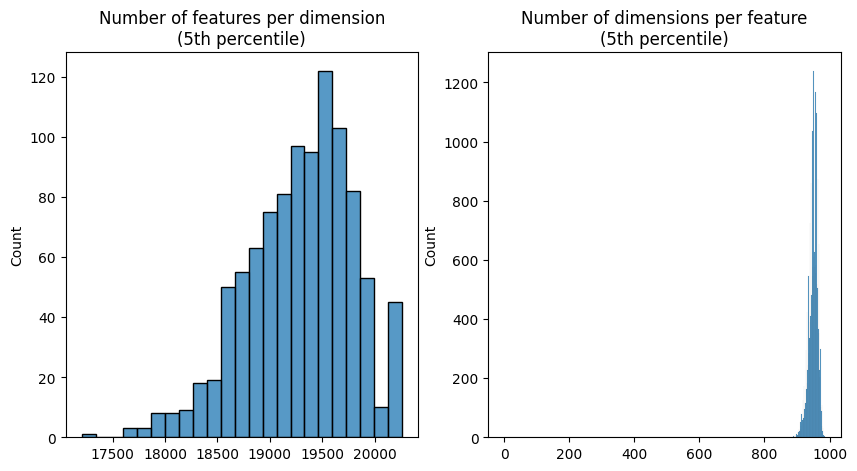

In [28]:
all_coeffs_norm = all_coeffs / np.linalg.norm(all_coeffs, axis=1)[:,None]
if np.isnan(all_coeffs_norm).any():
    print('nan values in all_coeffs_norm')
    all_coeffs_norm[np.isnan(all_coeffs_norm)] = 0

# what is the 5th percentile
threshold = np.percentile(np.abs(all_coeffs_norm), 5)
print(threshold)

#threshold = 0.1
bool_superpositions = np.abs(all_coeffs_norm) > threshold
features_per_dim = np.sum(bool_superpositions, axis=0)
dims_per_feature = np.sum(bool_superpositions, axis=1)

# plot histograms of both next to each other
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(features_per_dim, ax=ax[0])
ax[0].set_title('Number of features per dimension\n(5th percentile)')
sns.histplot(dims_per_feature, ax=ax[1])
ax[1].set_title('Number of dimensions per feature\n(5th percentile)')
plt.show()

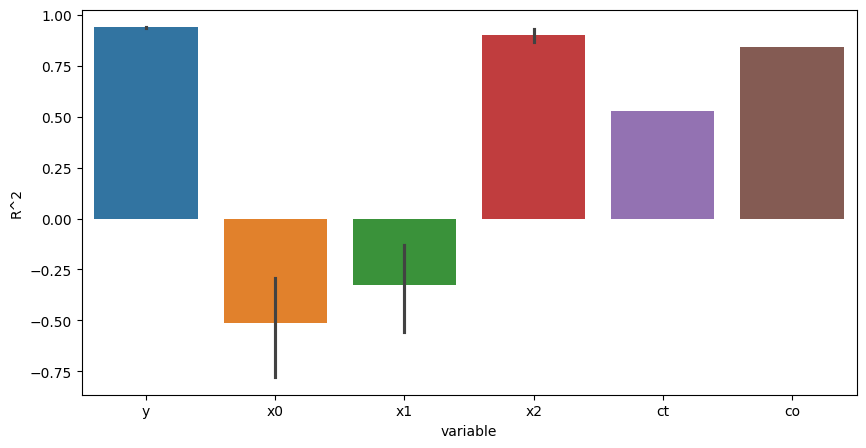

In [29]:
# plot average number of dimensions per feature and color by coeff_names

fig, ax = plt.subplots(1, 1, figsize=(10,5))
sns.barplot(x=coeff_names, y=all_fits, hue=coeff_names, ax=ax)
plt.ylabel('R^2')
plt.xlabel('variable')
plt.show()

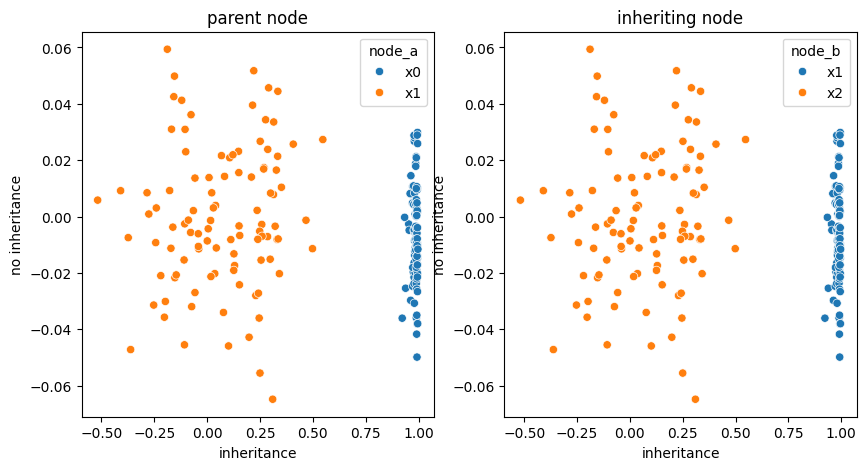

In [30]:
# calculate the cosine similarity between the same-index features from different x variables
# and compare them to all the other features

cos_sim_x_same = []
cos_sim_x_avgdiff = []
node_a = []
node_b = []
for i in range(x0_coeffs.shape[0]):
    temp_same = torch.nn.functional.cosine_similarity(torch.tensor(x0_coeffs[i,:]).unsqueeze(0).float(), torch.tensor(x1_coeffs[i,:]).unsqueeze(0).float(), dim=1).detach().cpu().item()
    temp_diff = torch.nn.functional.cosine_similarity(torch.tensor(x0_coeffs[~(np.arange(x0_coeffs.shape[0]) == i),:]).float(), torch.tensor(x1_coeffs[i,:]).float(), dim=1).detach().cpu().numpy().mean()
    cos_sim_x_same.append(temp_same)
    cos_sim_x_avgdiff.append(temp_diff)
    node_a.append('x0')
    node_b.append('x1')
    temp_same = torch.nn.functional.cosine_similarity(torch.tensor(x1_coeffs[i,:]).unsqueeze(0).float(), torch.tensor(x2_coeffs[i,:]).unsqueeze(0).float(), dim=1).detach().cpu().item()
    temp_diff = torch.nn.functional.cosine_similarity(torch.tensor(x1_coeffs[~(np.arange(x1_coeffs.shape[0]) == i),:]).float(), torch.tensor(x2_coeffs[i,:]).float(), dim=1).detach().cpu().numpy().mean()
    cos_sim_x_same.append(temp_same)
    cos_sim_x_avgdiff.append(temp_diff)
    node_a.append('x1')
    node_b.append('x2')

df_x_dependency = pd.DataFrame({
    'cos_sim_same': cos_sim_x_same,
    'cos_sim_avgdiff': cos_sim_x_avgdiff,
    'node_a': node_a,
    'node_b': node_b
})

# plot the cosine similarities
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.scatterplot(data=df_x_dependency, x='cos_sim_same', y='cos_sim_avgdiff', hue='node_a', ax=ax[0])
ax[0].set_title('parent node')
ax[0].set_xlabel('inheritance')
ax[0].set_ylabel('no inheritance')
sns.scatterplot(data=df_x_dependency, x='cos_sim_same', y='cos_sim_avgdiff', hue='node_b', ax=ax[1])
ax[1].set_title('inheriting node')
ax[1].set_xlabel('inheritance')
ax[1].set_ylabel('no inheritance')
plt.show()

# SAE

In [2]:
complexity = 'high'
n_samples = 10000
latent_dim = 150
model_depth = 2
dropout_rate = 0.1

for seed in range(10):
    temp_y = torch.load(data_dir+'large_{}-complexity_rs{}_y.pt'.format(complexity, seed), weights_only=False)
    temp_x0 = torch.load(data_dir+'large_{}-complexity_rs{}_x0.pt'.format(complexity, seed), weights_only=False)
    temp_x1 = torch.load(data_dir+'large_{}-complexity_rs{}_x1.pt'.format(complexity, seed), weights_only=False)
    temp_x2 = torch.load(data_dir+'large_{}-complexity_rs{}_x2.pt'.format(complexity, seed), weights_only=False)
    temp_ct = torch.load(data_dir+'large_{}-complexity_rs{}_ct.pt'.format(complexity, seed), weights_only=False)
    temp_cov = torch.load(data_dir+'large_{}-complexity_rs{}_co.pt'.format(complexity, seed), weights_only=False)
    if seed == 0:
        rna_counts = temp_y
        x0 = temp_x0
        x1 = temp_x1
        x2 = temp_x2
        ct = temp_ct
        co = temp_cov
    else:
        rna_counts = torch.cat((rna_counts, temp_y), dim=0)
        x0 = torch.cat((x0, temp_x0), dim=0)
        x1 = torch.cat((x1, temp_x1), dim=0)
        x2 = torch.cat((x2, temp_x2), dim=0)
        ct = torch.cat((ct, temp_ct), dim=0)
        co = torch.cat((co, temp_cov), dim=0)
# limit to the training data
n_samples_validation = int(n_samples*0.1)
rna_counts = rna_counts[-n_samples_validation:]
x0 = x0[-n_samples_validation:]
x1 = x1[-n_samples_validation:]
x2 = x2[-n_samples_validation:]
ct = ct[-n_samples_validation:]
co = co[-n_samples_validation:]

In [3]:
use_y = True

if use_y:
    comparison_data = np.concatenate((rna_counts.cpu().detach().numpy(), x0.cpu().detach().numpy(), x1.cpu().detach().numpy(), x2.cpu().detach().numpy(), ct.unsqueeze(1).cpu().detach().numpy(), co.unsqueeze(1).cpu().detach().numpy()), axis=1).T
    coeff_names = ['y']*rna_counts.shape[1] + ['x0']*x0.shape[1] + ['x1']*x1.shape[1] + ['x2']*x2.shape[1] + ['ct'] + ['co']
else:
    comparison_data = np.concatenate((x0.cpu().detach().numpy(), x1.cpu().detach().numpy(), x2.cpu().detach().numpy(), ct.unsqueeze(1).cpu().detach().numpy(), co.unsqueeze(1).cpu().detach().numpy()), axis=1).T
    coeff_names = ['x0']*x0.shape[1] + ['x1']*x1.shape[1] + ['x2']*x2.shape[1] + ['ct'] + ['co']

print(comparison_data.shape)

(20302, 1000)


In [4]:
from src.functions.sae_analysis_sim2 import *

### look at data

In [79]:
cos_sim_data = torch.zeros((rna_counts.shape[1], comparison_data[rna_counts.shape[1]:,].shape[0]))
for i in tqdm(range(rna_counts.shape[1])):
    cos_sim_data[i,:] = torch.nn.functional.cosine_similarity(comparison_data[rna_counts.shape[1]:,], rna_counts[:,i].unsqueeze(0), dim=1).detach().cpu()
cos_sim_data

100%|██████████| 20000/20000 [00:07<00:00, 2556.96it/s]


tensor([[0.6241, 0.6639, 0.6771,  ..., 0.4346, 0.8299, 0.7653],
        [0.5571, 0.6269, 0.5935,  ..., 0.5058, 0.7219, 0.7025],
        [0.6094, 0.6551, 0.6482,  ..., 0.3844, 0.7426, 0.7641],
        ...,
        [0.6586, 0.6851, 0.6950,  ..., 0.5612, 0.7969, 0.7728],
        [0.5522, 0.6128, 0.5875,  ..., 0.4707, 0.6087, 0.6430],
        [0.5942, 0.6444, 0.6437,  ..., 0.3825, 0.7044, 0.7253]])

In [84]:
# here all against all
cos_sim_data = torch.zeros((comparison_data.shape[0], comparison_data.shape[0]))
for i in tqdm(range(comparison_data.shape[0])):
    cos_sim_data[i,:] = torch.nn.functional.cosine_similarity(comparison_data, comparison_data[i,:].unsqueeze(0), dim=1).detach().cpu()

cos_sim_data.shape

  1%|          | 222/20302 [00:04<06:16, 53.33it/s]

100%|██████████| 20302/20302 [06:27<00:00, 52.44it/s]


torch.Size([20302, 20302])

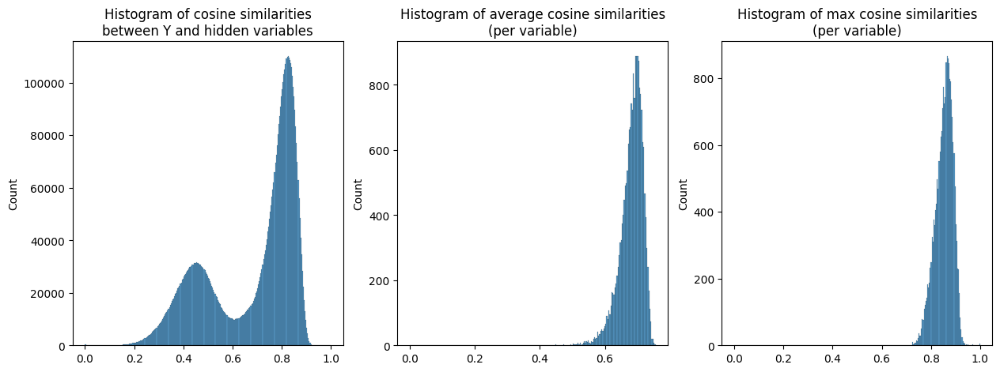

In [57]:
# plot all cosine similarities, as well as the averages and max per variable
cos_sim_avg = cos_sim_data.mean(axis=1)
cos_sim_max = cos_sim_data.max(axis=1).values

fig, ax = plt.subplots(1, 3, figsize=(15,5))
sns.histplot(cos_sim_data.flatten(), ax=ax[0])
ax[0].set_title('Histogram of cosine similarities\nbetween Y and hidden variables')
sns.histplot(cos_sim_avg, ax=ax[1])
ax[1].set_title('Histogram of average cosine similarities\n(per variable)')
sns.histplot(cos_sim_max, ax=ax[2])
ax[2].set_title('Histogram of max cosine similarities\n(per variable)')
plt.show()

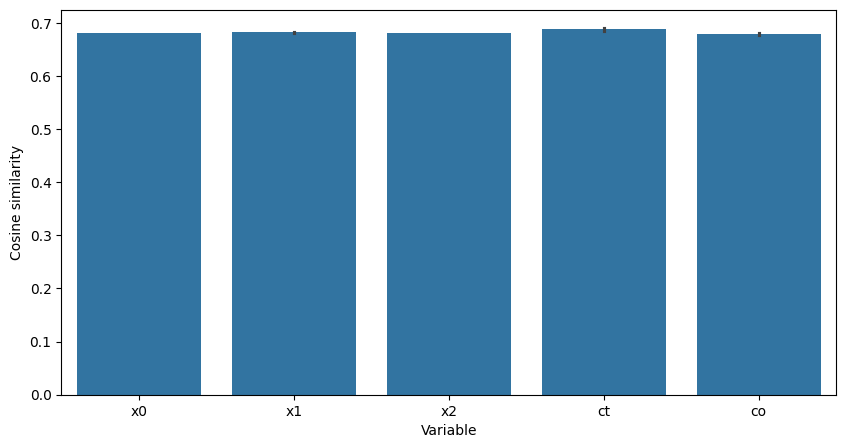

In [61]:
# plot a bar plot of the cosine similarities colored by the hidden variable (dim 1)
df_cos_sim = pd.DataFrame({
    'cos_sim': cos_sim_data.flatten(),
    'variable': np.repeat(coeff_names[rna_counts.shape[1]:], cos_sim_data.shape[0]).flatten()
})

fig, ax = plt.subplots(1, 1, figsize=(10,5))
sns.barplot(x='variable', y='cos_sim', data=df_cos_sim, ax=ax)
plt.ylabel('Cosine similarity')
plt.xlabel('Variable')
plt.show()

In [85]:
max_cos_sim_data = torch.zeros((comparison_data.shape[0], 2))
for i in range(comparison_data.shape[0]):
    max_cos_sim_data[i,0] = torch.max(cos_sim_data[:,i]).item()
    max_cos_sim_data[i,1] = torch.argmax(cos_sim_data[:,i]).item()

In [86]:
# build a graph of the non-redundant neurons
# edge weights should be the cosine similarities between the neurons
# node labels should be the variable with highest cosine similarity

import networkx as nx
G = nx.Graph()

# make a node attribute dict
label_color_dict = {'y': 'blue', 'x0': 'red', 'x1': 'green', 'x2': 'yellow', 'ct': 'purple', 'co': 'orange'}
node_dict = {i: {'label': coeff_names[int(max_cos_sim_data[i,1])], 'color': label_color_dict[coeff_names[int(max_cos_sim_data[i,1])]]} for i in range(comparison_data.shape[0])}
edge_tuples = [(i, j, cos_sim_data[i,j].item()) for i in range(comparison_data.shape[0]) for j in range(comparison_data.shape[0]) if ((i < j) and (cos_sim_data[i,j].item() > 0.7))]

G.add_nodes_from(node_dict)
G.add_weighted_edges_from(edge_tuples)

# plot the graph
pos = nx.spring_layout(G)
#pos = nx.spectral_layout(G)
node_colors = [node_dict[node]['color'] for node in G.nodes()]
plt.figure(figsize=(10,10))
nx.draw(G, pos, with_labels=True, node_color=node_colors)
plt.show()

KeyboardInterrupt: 

In [87]:
torch.manual_seed(0)
torch.cuda.manual_seed(0)
np.random.seed(0)
random.seed(0)
# adjacency matrices (binary)
p_xy = 0.1
xy = torch.tensor(np.random.binomial(1, p_xy, (100, 20000))).float()

In [94]:
xy.shape

torch.Size([100, 20000])

In [92]:
cos_sim_data.shape

torch.Size([20302, 20302])

In [93]:
# compare the cosine sims and xy

cos_sim_data[:20000,:][:,20000:20100]

tensor([[0.6241, 0.6639, 0.6771,  ..., 0.8607, 0.8665, 0.8546],
        [0.5571, 0.6269, 0.5935,  ..., 0.7779, 0.7810, 0.7817],
        [0.6094, 0.6551, 0.6482,  ..., 0.8285, 0.8357, 0.8214],
        ...,
        [0.6586, 0.6851, 0.6950,  ..., 0.8862, 0.8851, 0.8861],
        [0.5522, 0.6128, 0.5875,  ..., 0.7549, 0.7539, 0.7501],
        [0.5942, 0.6444, 0.6437,  ..., 0.8327, 0.8238, 0.8059]])

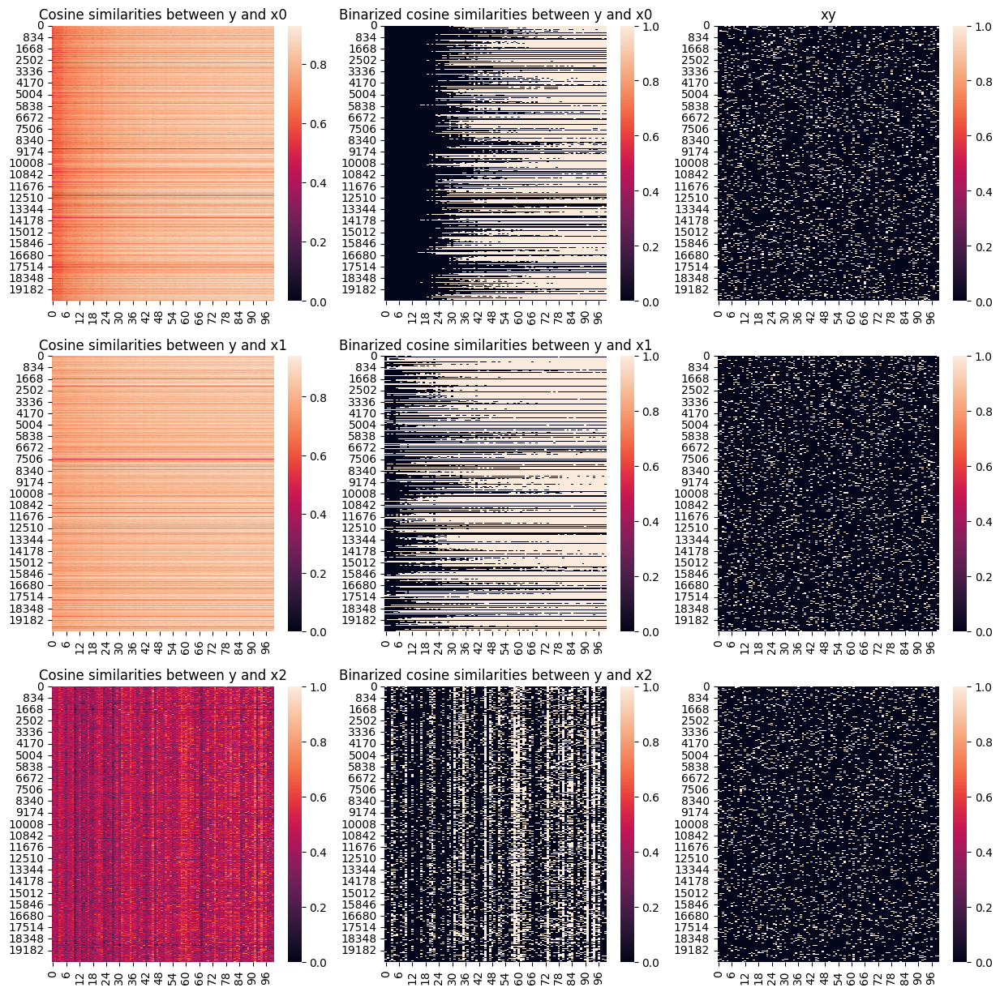

In [101]:
# histograms of the cosine similarities and xy for comparison
# make a binarized version of cos_sim_data

fig, ax = plt.subplots(3, 3, figsize=(15,15))
# x0
cos_sim_data_bin = (torch.abs(cos_sim_data[:20000,:][:,20000:20100]) > 0.8).int()
sns.heatmap(cos_sim_data[:20000,:][:,20000:20100], ax=ax[0][0])
ax[0][0].set_title('Cosine similarities between y and x0')
sns.heatmap(cos_sim_data_bin, ax=ax[0][1])
ax[0][1].set_title('Binarized cosine similarities between y and x0')
sns.heatmap(xy.T, ax=ax[0][2])
ax[0][2].set_title('xy')
# x1
cos_sim_data_bin = (torch.abs(cos_sim_data[:20000,:][:,20100:20200]) > 0.8).int()
sns.heatmap(cos_sim_data[:20000,:][:,20100:20200], ax=ax[1][0])
ax[1][0].set_title('Cosine similarities between y and x1')
sns.heatmap(cos_sim_data_bin, ax=ax[1][1])
ax[1][1].set_title('Binarized cosine similarities between y and x1')
sns.heatmap(xy.T, ax=ax[1][2])

# x2
cos_sim_data_bin = (torch.abs(cos_sim_data[:20000,:][:,20200:20300]) > 0.5).int()
sns.heatmap(cos_sim_data[:20000,:][:,20200:20300], ax=ax[2][0])
ax[2][0].set_title('Cosine similarities between y and x2')
sns.heatmap(cos_sim_data_bin, ax=ax[2][1])
ax[2][1].set_title('Binarized cosine similarities between y and x2')
sns.heatmap(xy.T, ax=ax[2][2])

plt.show()

In [151]:
# go througgh different thresholds and find the one that maximizes xy and the binary cosine sim matrix being identical
thresholds = np.linspace(0, 1, 100)

max_acc = 0
max_recall = 0
max_precision = 0
best_threshold = 0

for threshold in thresholds:
    cos_sim_data_bin = (torch.abs(cos_sim_data[:20000,:][:,20200:20300]) > threshold).int()
    acc = (cos_sim_data_bin == xy.T).float().mean().item()
    tp = (cos_sim_data_bin * xy.T).sum().item()
    fp = (cos_sim_data_bin * (1 - xy.T)).sum().item()
    fn = ((1 - cos_sim_data_bin) * xy.T).sum().item()
    recall = tp / (tp + fn + 1e-6)
    precision = tp / (tp + fp + 1e-6)
    if acc > max_acc:
        max_acc = acc
        max_recall = recall
        max_precision = precision
        best_threshold = threshold
print('Best threshold {} with accuracy {}, recall {} and precision {}'.format(best_threshold, max_acc, max_recall, max_precision))

Best threshold 0.6262626262626263 with accuracy 0.9179574847221375, recall 0.27063050996406335 and precision 0.7490282868697832


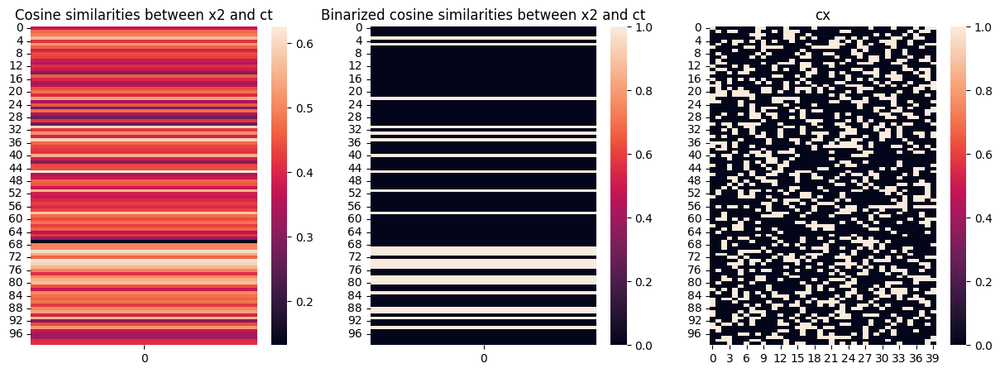

In [106]:
# now look for x2-ct to find cx

p_ctx = 0.3
cx = torch.tensor(np.random.binomial(1, p_ctx, (40, 100))).float()

# plot x2 vs ct cos_sim_data[20200:20300,:][:,20300] and cx in heatmaps
fig, ax = plt.subplots(1, 3, figsize=(15,5))
sns.heatmap(cos_sim_data[20200:20300,:][:,20300].unsqueeze(1), ax=ax[0])
ax[0].set_title('Cosine similarities between x2 and ct')
# now binarized
cos_sim_data_bin = (torch.abs(cos_sim_data[20200:20300,:][:,20300].unsqueeze(1)) > 0.5).int()
sns.heatmap(cos_sim_data_bin, ax=ax[1])
ax[1].set_title('Binarized cosine similarities between x2 and ct')
sns.heatmap(cx.T, ax=ax[2])
ax[2].set_title('cx')
plt.show()

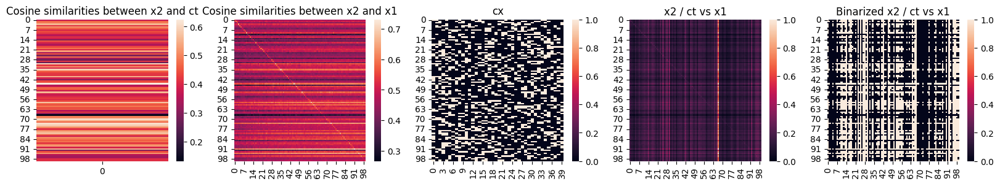

In [118]:
# now look for x2-ct to find cx

p_ctx = 0.3
cx = torch.tensor(np.random.binomial(1, p_ctx, (40, 100))).float()

# plot x2 vs ct cos_sim_data[20200:20300,:][:,20300] and cx in heatmaps
fig, ax = plt.subplots(1, 5, figsize=(20,3))
sns.heatmap(cos_sim_data[20200:20300,:][:,20300].unsqueeze(1), ax=ax[0])
ax[0].set_title('Cosine similarities between x2 and ct')
sns.heatmap(cos_sim_data[20200:20300,:][:,20100:20200], ax=ax[1])
ax[1].set_title('Cosine similarities between x2 and x1')
sns.heatmap(cx.T, ax=ax[2])
ax[2].set_title('cx')
# normalize the cosine similarities by ct (keep 0-1)
x1_ct = cos_sim_data[20200:20300,:][:,20100:20200] / cos_sim_data[20200:20300,:][:,20300].unsqueeze(0)
# now normalize to 0-1
x1_ct = (x1_ct - x1_ct.min()) / (x1_ct.max() - x1_ct.min())
sns.heatmap(x1_ct, ax=ax[3])
ax[3].set_title('x2 / ct vs x1')
# now binaryze
x1_ct_bin = (x1_ct > 0.15).int()
sns.heatmap(x1_ct_bin, ax=ax[4])
ax[4].set_title('Binarized x2 / ct vs x1')
plt.show()

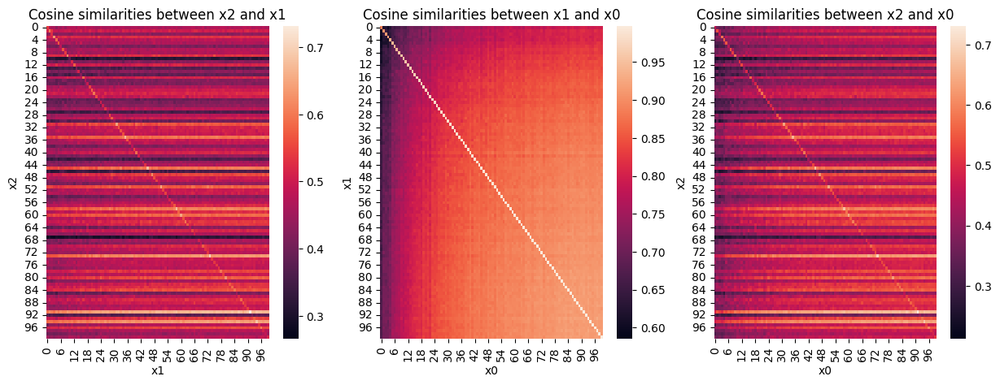

In [129]:
# heatmaps x2 vs x1, x1 vs x0

fig, ax = plt.subplots(1, 3, figsize=(15,5))
sns.heatmap(cos_sim_data[20200:20300,:][:,20100:20200], ax=ax[0])
ax[0].set_title('Cosine similarities between x2 and x1')
ax[0].set_xlabel('x1')
ax[0].set_ylabel('x2')
sns.heatmap(cos_sim_data[20100:20200,:][:,20000:20100], ax=ax[1])
ax[1].set_title('Cosine similarities between x1 and x0')
ax[1].set_xlabel('x0')
ax[1].set_ylabel('x1')
sns.heatmap(cos_sim_data[20200:20300,:][:,20000:20100], ax=ax[2])
ax[2].set_title('Cosine similarities between x2 and x0')
ax[2].set_xlabel('x0')
ax[2].set_ylabel('x2')
plt.show()

## latent 150

In [5]:
latent_dim = 150

# load encoder

#encoder = Encoder(20000, latent_dim, model_depth).to(device)
model_name = 'large_high-complexity_2-depth_{}-latent_0.1-dropout_100000-samples'.format(latent_dim)
encoder = torch.load('03_results/models/sim2_{}_encoder.pth'.format(model_name)).cpu()

encoder.eval()
reps = encoder(rna_counts).detach()

input_size = latent_dim
batch_size = 128
train_data = reps.clone().to(device)
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)

/tmp/ipykernel_1680213/3388184713.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder = torch.load('03_results/models/sim2_{}_encoder.pth'.format(model_name)).cpu()


### 1500 features (10x)

In [15]:
sae_model, loss = train_sae(
    train_loader,
    input_size=input_size,
    hidden_factor=10,
    lr=1e-5,
    l1_weight=1e-2,
    n_epochs=1000,
    sae_type='bricken',
    return_all_losses=True
)

reps_reconstructed, activations = sae_model(reps.to(device))

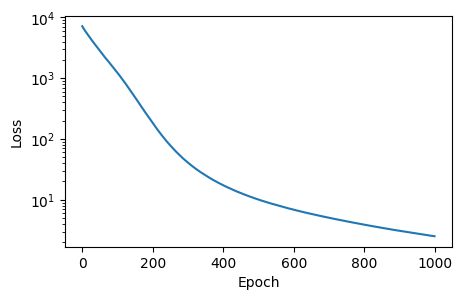

In [48]:
# plot the losses
fig, ax = plt.subplots(1, 1, figsize=(5,3))
sns.lineplot(x=range(len(loss)), y=loss, ax=ax)
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.yscale('log')
plt.show()

In [16]:
comparison_data = torch.tensor(comparison_data).float()
activations = activations.cpu().detach()

cos_sim = torch.zeros((comparison_data.shape[0], activations.shape[1]))
for i in tqdm(range(comparison_data.shape[0])):
    cos_sim[i,:] = torch.nn.functional.cosine_similarity(activations, comparison_data[i,:].unsqueeze(1), dim=0).detach().cpu()
cos_sim

/tmp/ipykernel_1643728/345891098.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  comparison_data = torch.tensor(comparison_data).float()
100%|██████████| 20302/20302 [00:17<00:00, 1182.18it/s]


tensor([[0.6721, 0.5844, 0.5880,  ..., 0.8188, 0.6040, 0.6360],
        [0.6064, 0.6442, 0.6384,  ..., 0.6193, 0.5946, 0.5177],
        [0.5931, 0.6896, 0.7148,  ..., 0.7298, 0.4724, 0.5181],
        ...,
        [0.0778, 0.4233, 0.3349,  ..., 0.2676, 0.2063, 0.2180],
        [0.6177, 0.4974, 0.5647,  ..., 0.6903, 0.4863, 0.5971],
        [0.6081, 0.6366, 0.6403,  ..., 0.6774, 0.4820, 0.4807]])

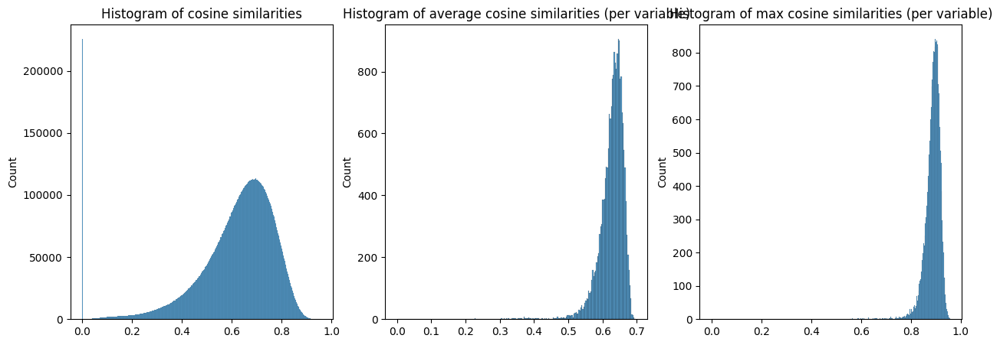

In [51]:
# plot all cosine similarities, as well as the averages and max per variable
cos_sim_avg = cos_sim.mean(axis=1)
cos_sim_max = cos_sim.max(axis=1).values

fig, ax = plt.subplots(1, 3, figsize=(15,5))
sns.histplot(cos_sim.flatten(), ax=ax[0])
ax[0].set_title('Histogram of cosine similarities')
sns.histplot(cos_sim_avg, ax=ax[1])
ax[1].set_title('Histogram of average cosine similarities (per variable)')
sns.histplot(cos_sim_max, ax=ax[2])
ax[2].set_title('Histogram of max cosine similarities (per variable)')
plt.show()

In [17]:
unique_active_indices = get_unique_active_unit_indices(sae_model, train_loader, threshold=1)
print('Number of unique active units:', len(unique_active_indices))

# get the maximum cosine similarity for each active feature, as well as the index
# there is no function for this
max_cos_sim = torch.zeros((len(unique_active_indices), 2))
for i, idx in enumerate(unique_active_indices):
    max_cos_sim[i,0] = torch.max(cos_sim[:,idx]).item()
    max_cos_sim[i,1] = torch.argmax(cos_sim[:,idx]).item()

Number of unique active units: 1484


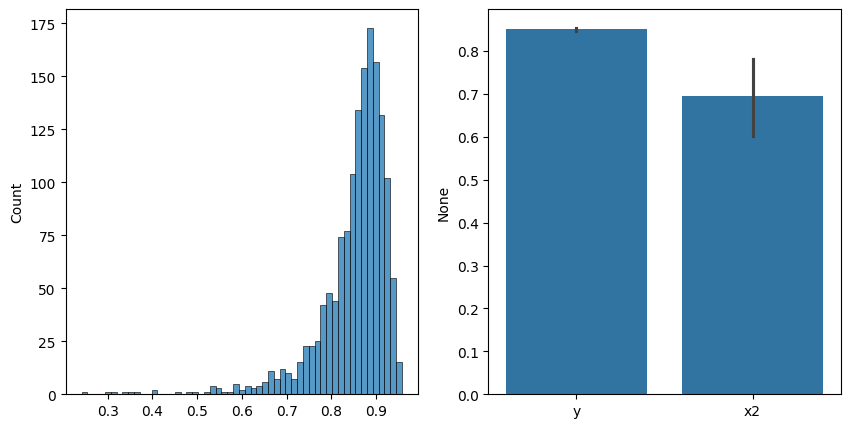

In [53]:
# plot the histogram of max_cos_sim
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(max_cos_sim[:,0], ax=ax[0])
# also plot this colored by the coeff_names
variable_colors = [coeff_names[int(x)] for x in max_cos_sim[:,1]]
sns.barplot(x=variable_colors, y=max_cos_sim[:,0], ax=ax[1])
plt.show()

0.37225850522518156


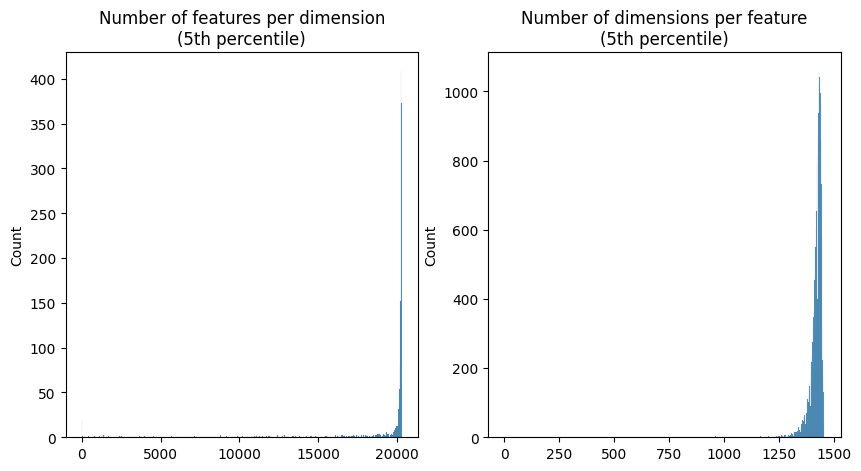

In [54]:
# what is the 5th percentile
threshold = np.percentile(np.abs(cos_sim[:,unique_active_indices]), 5)
print(threshold)

bool_superpositions = torch.abs(cos_sim) > threshold
features_per_dim = torch.sum(bool_superpositions, axis=0)
dims_per_feature = torch.sum(bool_superpositions, axis=1)

# plot histograms of both next to each other
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(features_per_dim, ax=ax[0])
ax[0].set_title('Number of features per dimension\n(5th percentile)')
sns.histplot(dims_per_feature, ax=ax[1])
ax[1].set_title('Number of dimensions per feature\n(5th percentile)')
plt.show()

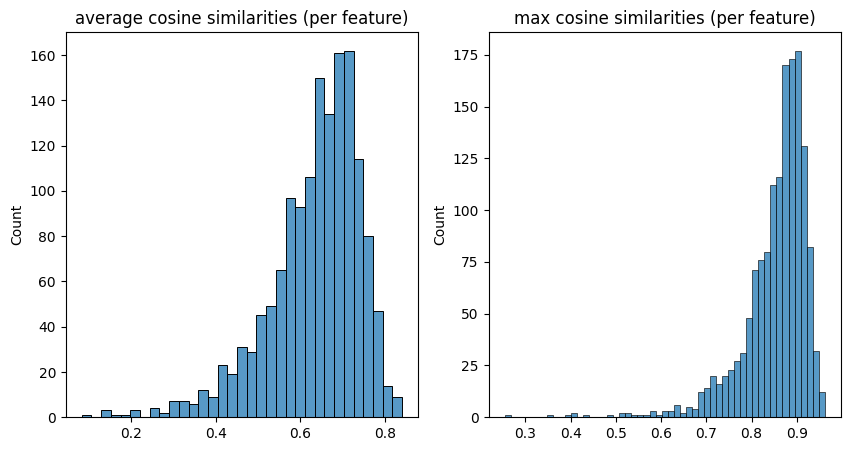

In [18]:
# plot all cosine similarities, as well as the averages and max per variable
cos_sim_avg = cos_sim[:,unique_active_indices].mean(axis=0)
cos_sim_max = cos_sim[:,unique_active_indices].max(axis=0).values

fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(cos_sim_avg, ax=ax[0])
ax[0].set_title('average cosine similarities (per feature)')
sns.histplot(cos_sim_max, ax=ax[1])
ax[1].set_title('max cosine similarities (per feature)')
plt.show()

### train and check: 15000 features

In [6]:
sae_model, loss = train_sae(
    train_loader,
    input_size=input_size,
    hidden_factor=100,
    lr=1e-5,
    l1_weight=1e-2,
    n_epochs=2000,
    sae_type='bricken',
    return_all_losses=True
)

reps_reconstructed, activations = sae_model(reps.to(device))

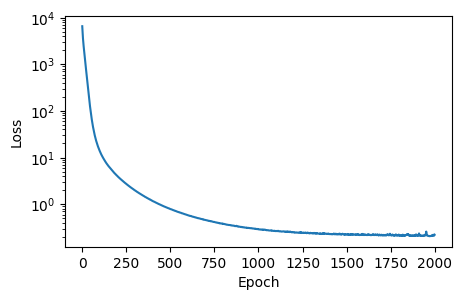

In [7]:
# plot the losses
fig, ax = plt.subplots(1, 1, figsize=(5,3))
sns.lineplot(x=range(len(loss)), y=loss, ax=ax)
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.yscale('log')
plt.show()

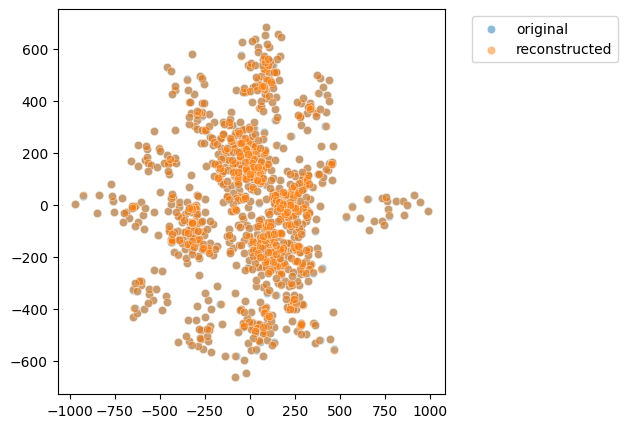

In [57]:
# plot pca of reps and reps_reconstructed
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
reps_pca = pca.fit_transform(reps.cpu().detach().numpy())
reps_reconstructed_pca = pca.transform(reps_reconstructed.cpu().detach().numpy())

fig, ax = plt.subplots(1, 1, figsize=(5,5))
sns.scatterplot(x=reps_pca[:,0], y=reps_pca[:,1], ax=ax, alpha=0.5, label='original')
sns.scatterplot(x=reps_reconstructed_pca[:,0], y=reps_reconstructed_pca[:,1], ax=ax, alpha=0.5, label='reconstructed')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

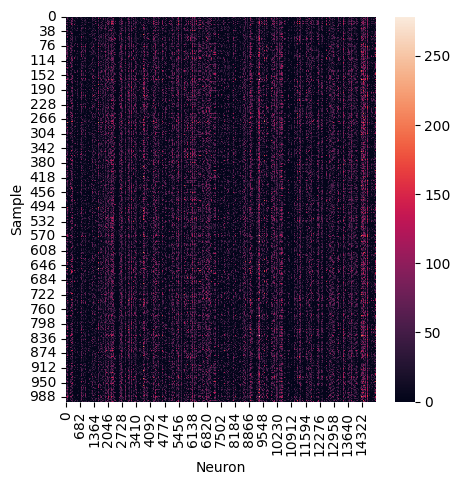

In [8]:
# plot the activations

fig, ax = plt.subplots(1, 1, figsize=(5,5))
sns.heatmap(activations.cpu().detach().numpy(), ax=ax)
plt.ylabel('Sample')
plt.xlabel('Neuron')
plt.show()

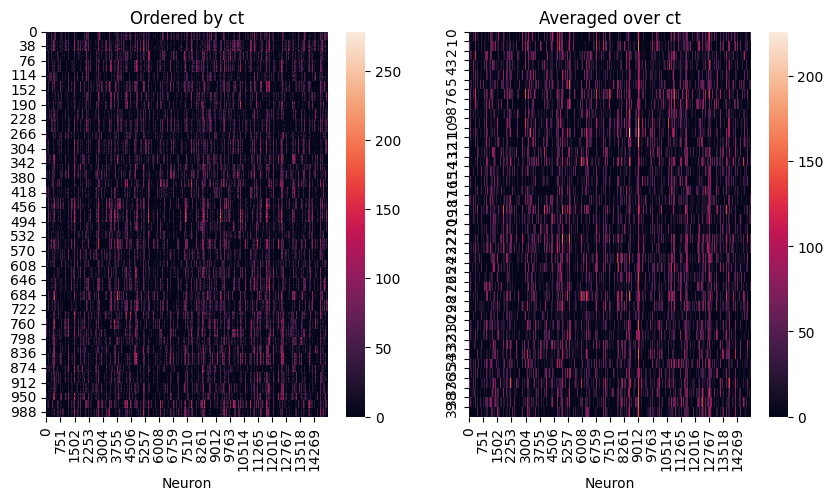

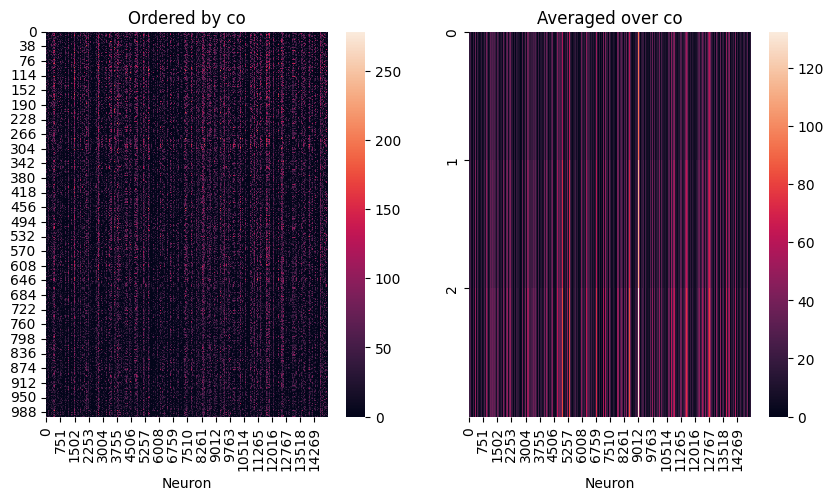

In [11]:
# order samples by ct and co and plot again

ct_order = torch.argsort(ct, descending=True)
co_order = torch.argsort(co, descending=True)

fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.heatmap(activations[ct_order,:].cpu().detach().numpy(), ax=ax[0])
ax[0].set_xlabel('Neuron')
ax[0].set_title('Ordered by ct')
# on the other size plot them averaged over ct
ct_mean_activations = torch.zeros((ct.unique().shape[0], activations.shape[1]))
for i, ct_val in enumerate(ct.unique()):
    ct_mean_activations[i,:] = activations[ct == ct_val,:].mean(axis=0)
sns.heatmap(ct_mean_activations.cpu().detach().numpy(), ax=ax[1])
ax[1].set_yticks(range(ct.unique().shape[0]))
ax[1].set_yticklabels(ct.unique().numpy())
ax[1].set_xlabel('Neuron')
ax[1].set_title('Averaged over ct')
plt.show()

# now the same for co
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.heatmap(activations[co_order,:].cpu().detach().numpy(), ax=ax[0])
ax[0].set_xlabel('Neuron')
ax[0].set_title('Ordered by co')
# on the other size plot them averaged over co
co_mean_activations = torch.zeros((co.unique().shape[0], activations.shape[1]))
for i, co_val in enumerate(co.unique()):
    co_mean_activations[i,:] = activations[co == co_val,:].mean(axis=0)
sns.heatmap(co_mean_activations.cpu().detach().numpy(), ax=ax[1])
ax[1].set_yticks(range(co.unique().shape[0]))
ax[1].set_yticklabels(co.unique().numpy())
ax[1].set_xlabel('Neuron')
ax[1].set_title('Averaged over co')
plt.show()


In [17]:
# try to find the redundant sae features wrt ct to see if I can get the cx matrix back

cos_sim_ct = torch.zeros((ct_mean_activations.shape[1], ct_mean_activations.shape[1]))
for i in tqdm(range(ct_mean_activations.shape[1])):
    #print(ct_mean_activations.shape, ct_mean_activations[i,:].shape)
    # for cos sim dim 0: need (n, m) and (m, k)
    cos_sim_ct[i,:] = torch.nn.functional.cosine_similarity(ct_mean_activations, ct_mean_activations[:,i].unsqueeze(1), dim=0).detach().cpu()
cos_sim_ct.shape

  4%|▎         | 553/15000 [00:02<01:01, 236.02it/s]

100%|██████████| 15000/15000 [01:11<00:00, 209.02it/s]


torch.Size([15000, 15000])

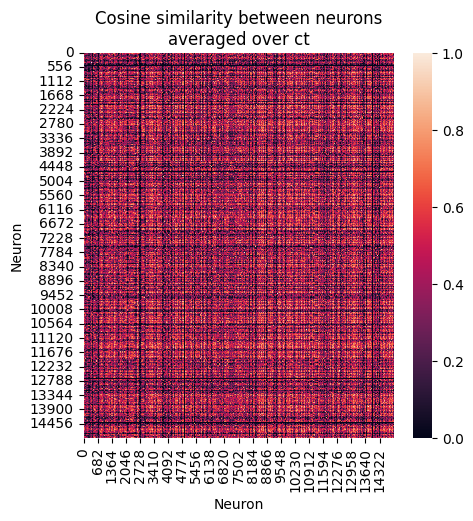

In [19]:
# heatmap cos_sim_ct

fig, ax = plt.subplots(1, 1, figsize=(5,5))
sns.heatmap(cos_sim_ct.cpu().detach().numpy(), ax=ax)
plt.ylabel('Neuron')
plt.xlabel('Neuron')
plt.title('Cosine similarity between neurons\naveraged over ct')
plt.show()

In [48]:
# filter out all neurons that have a cosine similarity of >=0.9 with another neuron and keep the rest as an index list
threshold = 0.75
# get the upper triangle without diagonal
upper_tri_indices = np.triu_indices(cos_sim_ct.shape[0], k=1)
cos_sim_ct_upper = cos_sim_ct[upper_tri_indices]
cos_sim_above_threshold = cos_sim_ct_upper >= threshold
redundant_neurons = set(upper_tri_indices[1][cos_sim_above_threshold])
print(len(redundant_neurons))
#print(len(nonredundant_neurons))
nonredundant_neurons = (set(range(cos_sim_ct.shape[0])) - redundant_neurons).intersection(set(unique_active_indices))
print(len(nonredundant_neurons))

14563
356


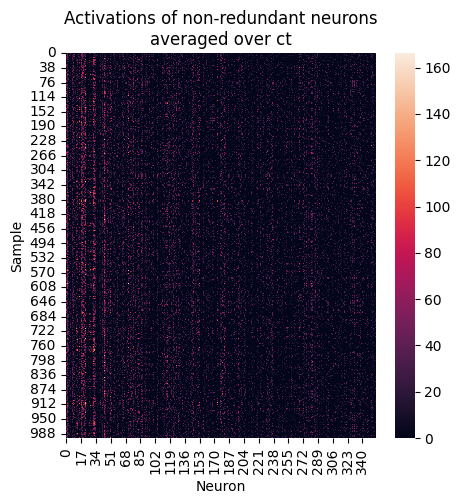

In [53]:
# heatmap cos_sim_ct

fig, ax = plt.subplots(1, 1, figsize=(5,5))
sns.heatmap(activations[:,list(nonredundant_neurons)].cpu().detach().numpy(), ax=ax)
plt.ylabel('Sample')
plt.xlabel('Neuron')
plt.title('Activations of non-redundant neurons\naveraged over ct')
plt.show()

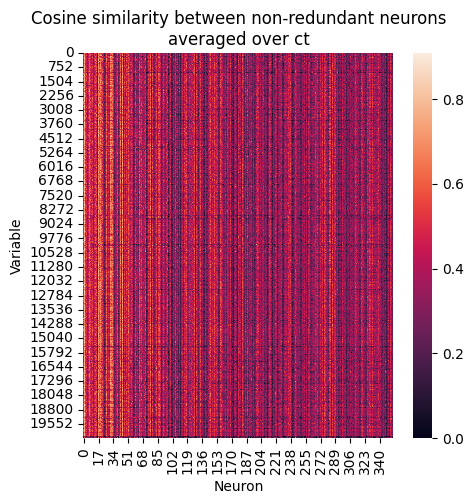

In [54]:
# heatmap cos_sim_ct

fig, ax = plt.subplots(1, 1, figsize=(5,5))
sns.heatmap(cos_sim[:,list(nonredundant_neurons)].cpu().detach().numpy(), ax=ax)
plt.ylabel('Variable')
plt.xlabel('Neuron')
plt.title('Cosine similarity between non-redundant neurons\naveraged over ct')
plt.show()

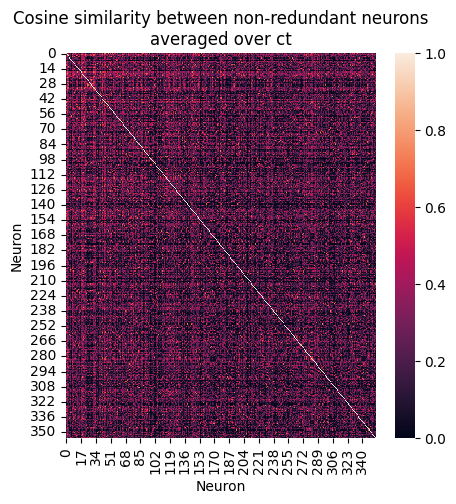

In [55]:
# heatmap cos_sim_ct

fig, ax = plt.subplots(1, 1, figsize=(5,5))
sns.heatmap(cos_sim_ct[list(nonredundant_neurons),:][:,list(nonredundant_neurons)].cpu().detach().numpy(), ax=ax)
plt.ylabel('Neuron')
plt.xlabel('Neuron')
plt.title('Cosine similarity between non-redundant neurons\naveraged over ct')
plt.show()

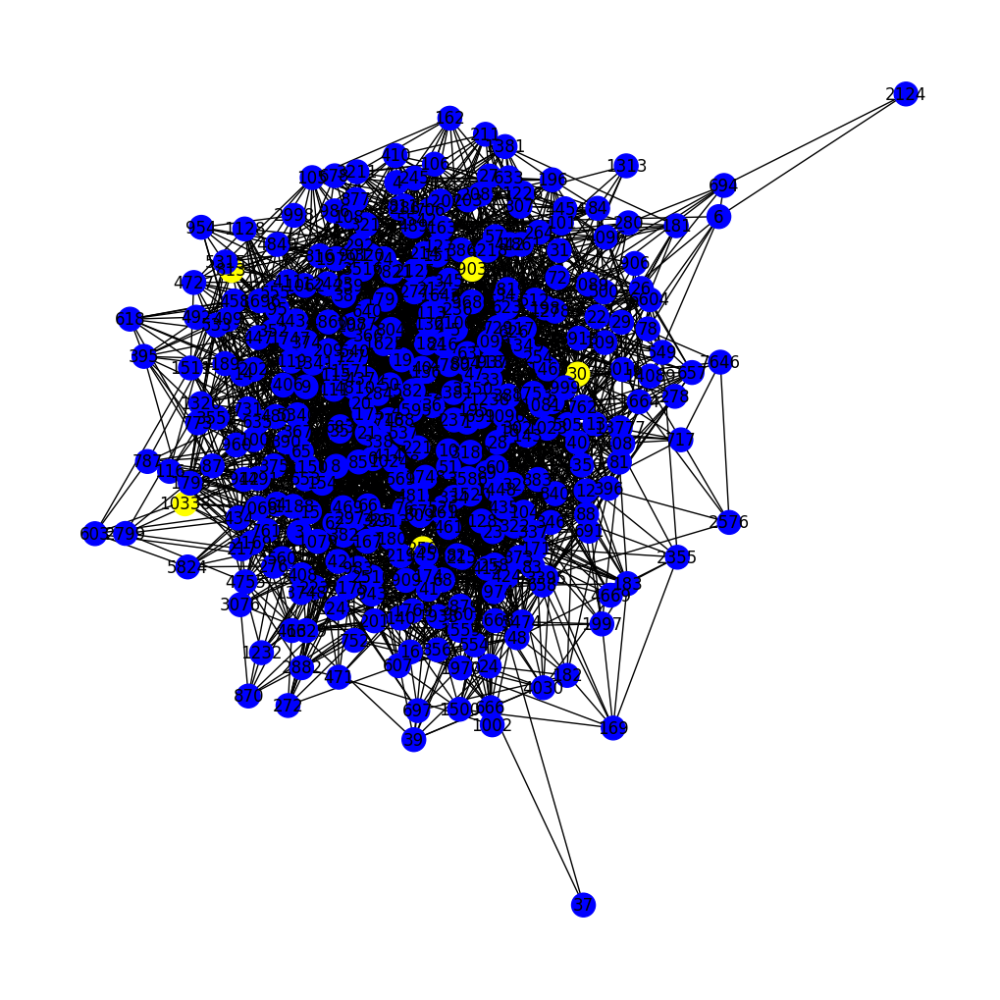

In [78]:
# build a graph of the non-redundant neurons
# edge weights should be the cosine similarities between the neurons
# node labels should be the variable with highest cosine similarity

import networkx as nx
G = nx.Graph()

# make a node attribute dict
label_color_dict = {'y': 'blue', 'x0': 'red', 'x1': 'green', 'x2': 'yellow', 'ct': 'purple', 'co': 'orange'}
node_dict = {i: {'label': coeff_names[int(max_cos_sim[i,1])], 'color': label_color_dict[coeff_names[int(max_cos_sim[i,1])]]} for i in list(nonredundant_neurons)}
edge_tuples = [(idx, jdx, cos_sim_ct[idx,jdx].item()) for i, idx in enumerate(nonredundant_neurons) for j, jdx in enumerate(nonredundant_neurons) if ((i < j) and (cos_sim_ct[idx,jdx].item() > 0.5))]

G.add_nodes_from(node_dict)
G.add_weighted_edges_from(edge_tuples)

# plot the graph
pos = nx.spring_layout(G)
#pos = nx.spectral_layout(G)
node_colors = [node_dict[node]['color'] for node in G.nodes()]
plt.figure(figsize=(10,10))
nx.draw(G, pos, with_labels=True, node_color=node_colors)
plt.show()

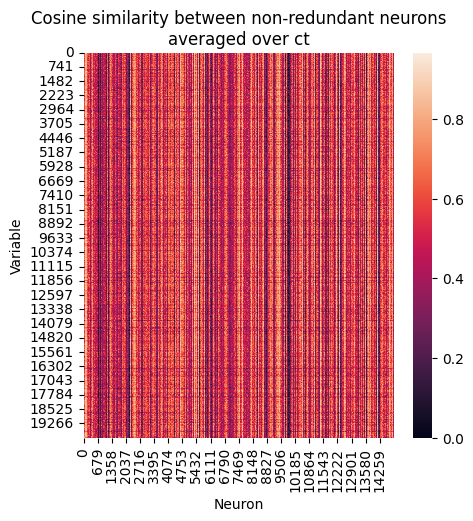

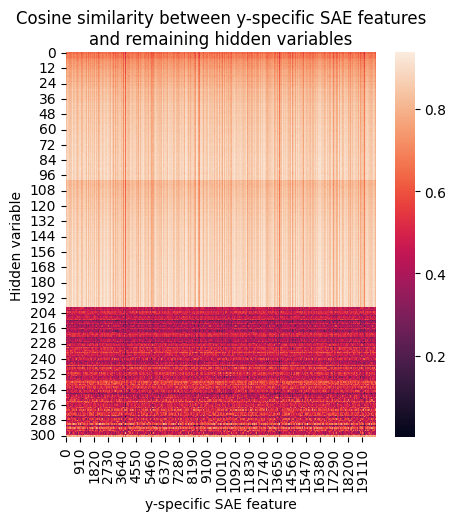

In [132]:
# for every observable variable y, find the highest correlating SAE feature
# then plot the cosine similarities between those SAE features agains the remaining unique active features

# get the maximum cosine similarity for each active feature, as well as the index
fig, ax = plt.subplots(1, 1, figsize=(5,5))
sns.heatmap(cos_sim[:20000,unique_active_indices].cpu().detach().numpy(), ax=ax)
plt.ylabel('Variable')
plt.xlabel('Neuron')
plt.title('Cosine similarity between non-redundant neurons\naveraged over ct')
plt.show()

sae_feature_for_y = []
for i in range(rna_counts.shape[1]):
    sae_feature_for_y.append(torch.argmax(cos_sim[i,:]).item())

# now plot the cosine sims between remaining variables and the sae features for y
fig, ax = plt.subplots(1, 1, figsize=(5,5))
sns.heatmap(cos_sim[20000:,:][:,sae_feature_for_y].cpu().detach().numpy(), ax=ax)
plt.ylabel('Hidden variable')
plt.xlabel('y-specific SAE feature')
plt.title('Cosine similarity between y-specific SAE features\nand remaining hidden variables')
plt.show()

Number of non-y-specific SAE features: 13486


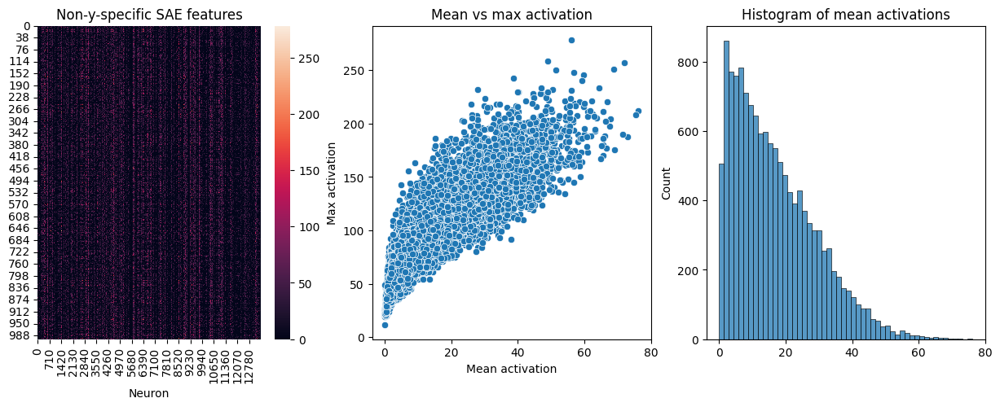

In [136]:
# get all remaining sae features
non_y_sae_features = list(set(unique_active_indices) - set(sae_feature_for_y))
print('Number of non-y-specific SAE features:', len(non_y_sae_features))

# plot their mean vs max activations

fig, ax = plt.subplots(1, 3, figsize=(15,5))
sns.heatmap(activations[:,non_y_sae_features].cpu().detach().numpy(), ax=ax[0])
ax[0].set_xlabel('Neuron')
ax[0].set_title('Non-y-specific SAE features')
# on the other size plot them averaged over ct
sns.scatterplot(x=activations[:,non_y_sae_features].mean(axis=0).cpu().detach().numpy(), y=activations[:,non_y_sae_features].max(axis=0).values.cpu().detach().numpy(), ax=ax[1])
ax[1].set_xlabel('Mean activation')
ax[1].set_ylabel('Max activation')
ax[1].set_title('Mean vs max activation')
# now a histogram of mean activations
sns.histplot(activations[:,non_y_sae_features].mean(axis=0).cpu().detach().numpy(), ax=ax[2])
ax[2].set_title('Histogram of mean activations')
plt.show()


In [140]:
activations.shape

torch.Size([1000, 15000])

In [143]:
# here all against all
cos_sim_sae = torch.zeros((activations.shape[1], activations.shape[1]))
for i in tqdm(range(activations.shape[1])):
    cos_sim_sae[i,:] = torch.nn.functional.cosine_similarity(activations, activations[:,i].unsqueeze(1), dim=0).detach().cpu()

cos_sim_sae.shape

  5%|▍         | 725/15000 [00:08<02:38, 90.15it/s]

100%|██████████| 15000/15000 [02:49<00:00, 88.56it/s]


torch.Size([15000, 15000])

In [163]:
cos_sim.shape

torch.Size([20302, 15000])

Best threshold 0.9191919191919192 with accuracy 0.8999375104904175, recall 9.995402115027088e-05, precision 0.27397259898667675


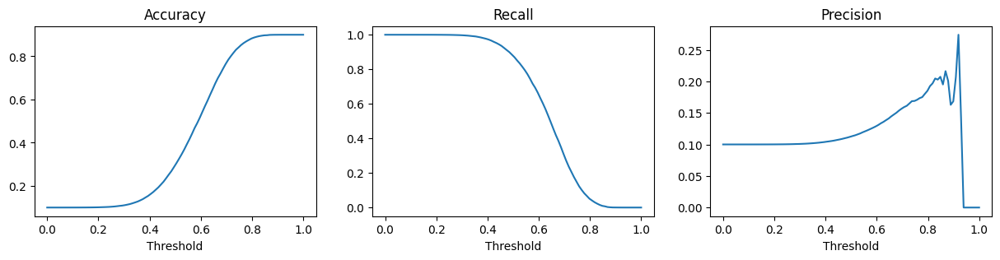

Threshold: 0.7, Accuracy 0.7700700163841248, recall 0.2983027807208684, precision 0.1574283121975887


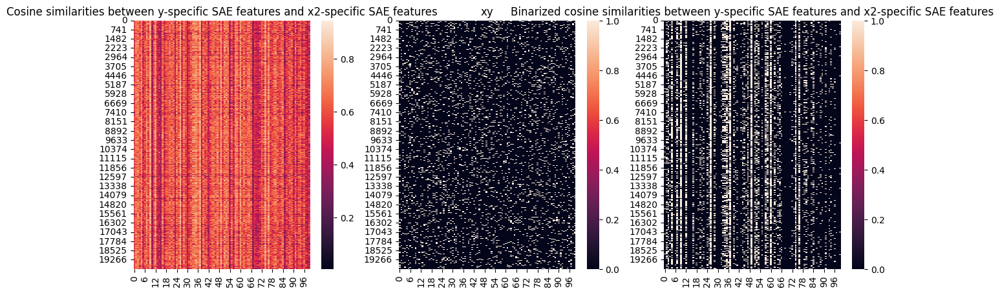

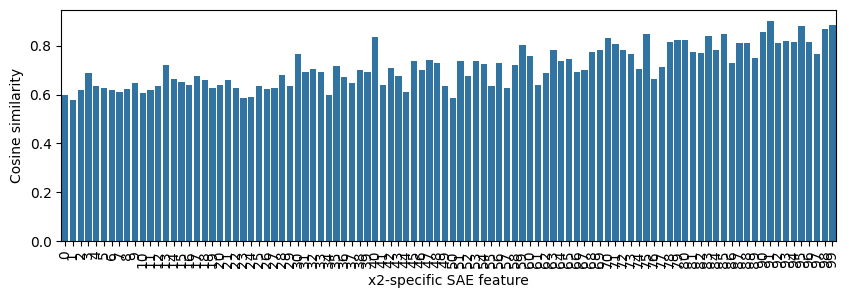

In [169]:
# find the best matches between x2 and non_y_sae_features

sae_feature_for_x2 = []
for i in range(20200,20300):
    sae_feature_for_x2.append(non_y_sae_features[torch.argmax(cos_sim[i,non_y_sae_features]).item()])

# go througgh different thresholds and find the one that maximizes xy and the binary cosine sim matrix being identical
thresholds = np.linspace(0, 1, 100)

max_acc = 0
max_recall = 0
max_precision = 0
best_threshold = 0
accs = []
recalls = []
precisions = []

for threshold in thresholds:
    cos_sim_bin = (torch.abs(cos_sim_sae[sae_feature_for_y,:][:,sae_feature_for_x2]) > threshold).int()
    acc = (cos_sim_bin == xy.T).float().mean().item()
    # calc recall and precision
    # recall: true positive / (true positive + false negative)
    # precision: true positive / (true positive + false positive)
    # true positive
    tp = (cos_sim_bin * xy.T).sum().item()
    # false positive
    fp = ((cos_sim_bin - xy.T) == 1).sum().item()
    # false negative
    fn = ((xy.T - cos_sim_bin) == 1).sum().item()
    recall = tp / (tp + fn)
    precision = tp / (tp + fp + 1e-6)
    #if acc > max_acc:
    accs.append(acc)
    recalls.append(recall)
    precisions.append(precision)
    if precision > max_precision:
        max_acc = acc
        max_recall = recall
        max_precision = precision
        best_threshold = threshold
print('Best threshold {} with accuracy {}, recall {}, precision {}'.format(best_threshold, max_acc, max_recall, max_precision))

# plot the accuracy, recall and precision
fig, ax = plt.subplots(1, 3, figsize=(15,3))
sns.lineplot(x=thresholds, y=accs, ax=ax[0])
ax[0].set_title('Accuracy')
ax[0].set_xlabel('Threshold')
sns.lineplot(x=thresholds, y=recalls, ax=ax[1])
ax[1].set_title('Recall')
ax[1].set_xlabel('Threshold')
sns.lineplot(x=thresholds, y=precisions, ax=ax[2])
ax[2].set_title('Precision')
ax[2].set_xlabel('Threshold')
plt.show()
# take the threshold and plot the 3 matrices (cos_sim_sae, xy, cos_sim_bin)

threshold = 0.7
cos_sim_bin = (torch.abs(cos_sim_sae[sae_feature_for_y,:][:,sae_feature_for_x2]) > threshold).int()
acc = (cos_sim_bin == xy.T).float().mean().item()
tp = (cos_sim_bin * xy.T).sum().item()
fp = ((cos_sim_bin - xy.T) == 1).sum().item()
fn = ((xy.T - cos_sim_bin) == 1).sum().item()
recall = tp / (tp + fn)
precision = tp / (tp + fp + 1e-6)
print('Threshold: {}, Accuracy {}, recall {}, precision {}'.format(threshold, acc, recall, precision))
fig, ax = plt.subplots(1, 3, figsize=(15,5))
sns.heatmap(cos_sim_sae[sae_feature_for_y,:][:,sae_feature_for_x2], ax=ax[0])
ax[0].set_title('Cosine similarities between y-specific SAE features and x2-specific SAE features')
sns.heatmap(xy.T, ax=ax[1])
ax[1].set_title('xy')
cos_sim_bin = (torch.abs(cos_sim_sae[sae_feature_for_y,:][:,sae_feature_for_x2]) >= threshold).int()
sns.heatmap(cos_sim_bin, ax=ax[2])
ax[2].set_title('Binarized cosine similarities between y-specific SAE features and x2-specific SAE features')
plt.show()

# bar plot of the cosine similarities 
fig, ax = plt.subplots(1, 1, figsize=(10,3))
sns.barplot(x=range(len(sae_feature_for_x2)), y=cos_sim[torch.arange(20200,20300),sae_feature_for_x2])
# rotate the x labels
plt.xticks(rotation=90)
plt.ylabel('Cosine similarity')
plt.xlabel('x2-specific SAE feature')
plt.show()

In [171]:
cos_sim_sae.shape

torch.Size([15000, 15000])

13486


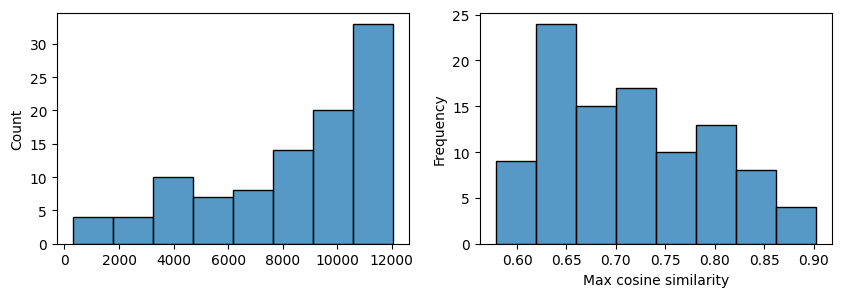

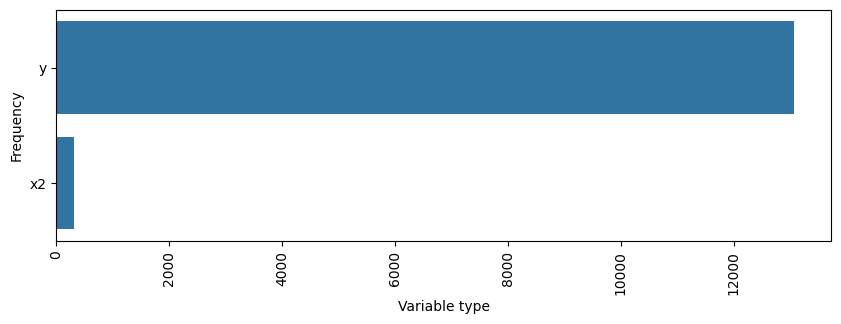

In [178]:
# what are the ranks of the x2-specific SAE features in terms of max cosine sim with non-y-specific SAE features
max_cos_sim_temp_non_y = cos_sim.max(axis=0).values[non_y_sae_features]
print(len(max_cos_sim_temp_non_y))

ranks = []
x2_max_cos_sims = []
for i, cos_temp in enumerate(sae_feature_for_x2):
    ranks.append(torch.sum(max_cos_sim_temp_non_y > cos_sim[20200+i,cos_temp]).item())
    x2_max_cos_sims.append(cos_sim[20200+i,cos_temp].item())

# plot histogram of ranks
fig, ax = plt.subplots(1, 2, figsize=(10,3))
sns.histplot(ranks, ax=ax[0])
plt.ylabel('Frequency')
plt.xlabel('Rank')
sns.histplot(x2_max_cos_sims, ax=ax[1])
plt.ylabel('Frequency')
plt.xlabel('Max cosine similarity')
plt.show()

# what variables do the remaining non-y-non-x2-specific SAE features correspond to?
non_y_non_x2_sae_features = list(set(non_y_sae_features) - set(sae_feature_for_x2))
best_remaining_variables = []
for i in non_y_non_x2_sae_features:
    best_remaining_variables.append(coeff_names[cos_sim[:,i].argmax().item()])
# plot a bar plot for these counts
fig, ax = plt.subplots(1, 1, figsize=(10,3))
sns.countplot(best_remaining_variables, ax=ax)
plt.ylabel('Frequency')
plt.xlabel('Variable type')
plt.xticks(rotation=90)
plt.show()

speaks to redundant y variables that score higher than x2, can we filter these out by cos_sim_sae?

In [196]:
threshold = 0.9

y_redundant_features = []
for i in tqdm(range(rna_counts.shape[1])):
    # best feature for this observable
    best_feature = torch.argmax(cos_sim[i,:]).item()
    y_redundant_features.extend(torch.where(cos_sim_sae[best_feature,non_y_sae_features] > threshold)[0].tolist())
y_redundant_features = list(set(y_redundant_features))
print(len(y_redundant_features))

print('N conflicts between redundant and x2-specific SAE features:', len(set(y_redundant_features).intersection(set(sae_feature_for_x2))))

100%|██████████| 20000/20000 [00:38<00:00, 518.90it/s]

1136
N conflicts between redundant and x2-specific SAE features: 6


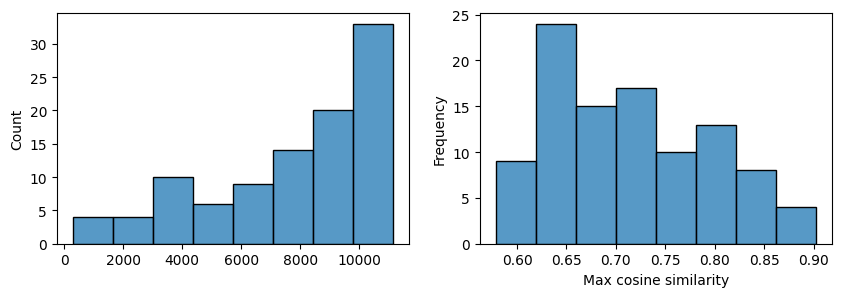

In [197]:
non_y_non_redundant_sae_features = list(set(non_y_sae_features) - set(y_redundant_features))

max_cos_sim_temp_non_y = cos_sim.max(axis=0).values[non_y_non_redundant_sae_features]

ranks = []
x2_max_cos_sims = []
for i, cos_temp in enumerate(sae_feature_for_x2):
    ranks.append(torch.sum(max_cos_sim_temp_non_y > cos_sim[20200+i,cos_temp]).item())
    x2_max_cos_sims.append(cos_sim[20200+i,cos_temp].item())

# plot histogram of ranks
fig, ax = plt.subplots(1, 2, figsize=(10,3))
sns.histplot(ranks, ax=ax[0])
plt.ylabel('Frequency')
plt.xlabel('Rank')
sns.histplot(x2_max_cos_sims, ax=ax[1])
plt.ylabel('Frequency')
plt.xlabel('Max cosine similarity')
plt.show()

100%|██████████| 20000/20000 [00:33<00:00, 599.00it/s]


5299
N conflicts between redundant and x2-specific SAE features: 36


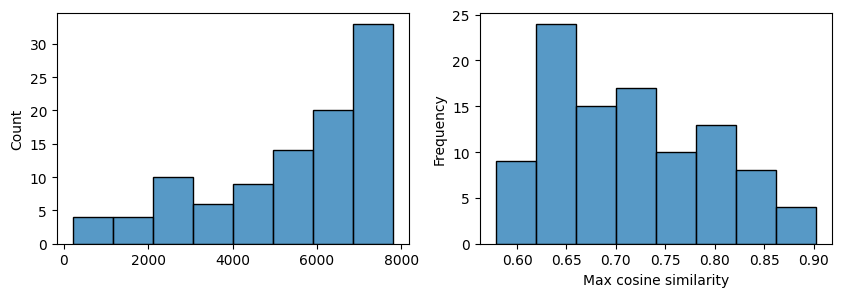

In [ ]:
# removing redundant features from the equation

threshold = 0.8

y_redundant_features = []
for i in tqdm(range(rna_counts.shape[1])):
    y_redundant_features.extend(torch.where(cos_sim[i,non_y_sae_features] > threshold)[0].tolist())
y_redundant_features = list(set(y_redundant_features))
print(len(y_redundant_features))

print('N conflicts between redundant and x2-specific SAE features:', len(set(y_redundant_features).intersection(set(sae_feature_for_x2))))

non_y_non_redundant_sae_features = list(set(non_y_sae_features) - set(y_redundant_features))

max_cos_sim_temp_non_y = cos_sim.max(axis=0).values[non_y_non_redundant_sae_features]

ranks = []
x2_max_cos_sims = []
for i, cos_temp in enumerate(sae_feature_for_x2):
    ranks.append(torch.sum(max_cos_sim_temp_non_y > cos_sim[20200+i,cos_temp]).item())
    x2_max_cos_sims.append(cos_sim[20200+i,cos_temp].item())

# plot histogram of ranks
fig, ax = plt.subplots(1, 2, figsize=(10,3))
sns.histplot(ranks, ax=ax[0])
plt.ylabel('Frequency')
plt.xlabel('Rank')
sns.histplot(x2_max_cos_sims, ax=ax[1])
plt.ylabel('Frequency')
plt.xlabel('Max cosine similarity')
plt.show()

In [198]:
# where is the ct variable?
ct_index = coeff_names.index('ct')
print(ct_index)

# get the corresponding sae feature
sae_feature_for_ct = torch.argmax(cos_sim[ct_index,:]).item()
print(sae_feature_for_ct, cos_sim[ct_index,sae_feature_for_ct].item())

20300
4663 0.8798471689224243


In [202]:
# what if I set the ct feature to zero, predict perturbed activations and check if now the y-x2 cosine similarity is higher

activs_perturbed = activations.clone()
activs_perturbed[:,sae_feature_for_ct] = 0
latents_perturbed = sae_model.decoder(activs_perturbed.to(device))

# now predict the perturbed observations
decoder = torch.load('03_results/models/sim2_{}_decoder.pth'.format(model_name)).to(device)
rna_counts_perturbed = decoder(latents_perturbed).detach().cpu()
print(activs_perturbed.shape, latents_perturbed.shape, rna_counts_perturbed.shape)

cos_sim_ct_perturbed = torch.zeros((rna_counts_perturbed.shape[1], activations.shape[1]))

for i in tqdm(range(rna_counts_perturbed.shape[1])):
    cos_sim_ct_perturbed[i,:] = torch.nn.functional.cosine_similarity(activs_perturbed, rna_counts_perturbed[:,i].unsqueeze(1), dim=0).detach().cpu()

/tmp/ipykernel_1680213/2235542654.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  decoder = torch.load('03_results/models/sim2_{}_decoder.pth'.format(model_name)).to(dev

torch.Size([1000, 15000]) torch.Size([1000, 150]) torch.Size([1000, 20000])


  0%|          | 27/20000 [00:00<04:00, 83.11it/s]

100%|██████████| 20000/20000 [03:48<00:00, 87.42it/s]


Best threshold 0.8282828282828284 with accuracy 0.8926864862442017, recall 0.022784519121204248, precision 0.19274510632085803


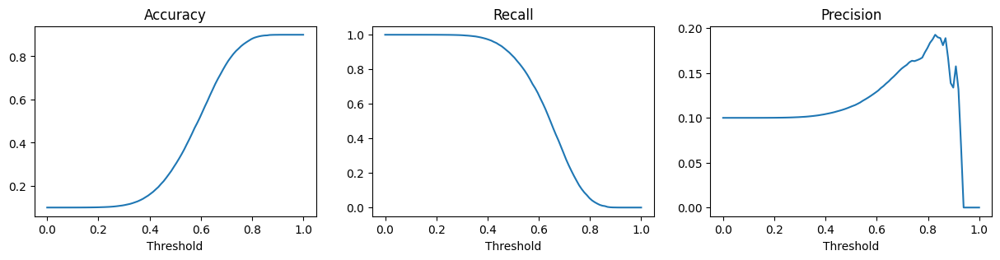

Threshold: 0.7, Accuracy 0.7647855281829834, recall 0.30441496911420746, precision 0.15532220349359488


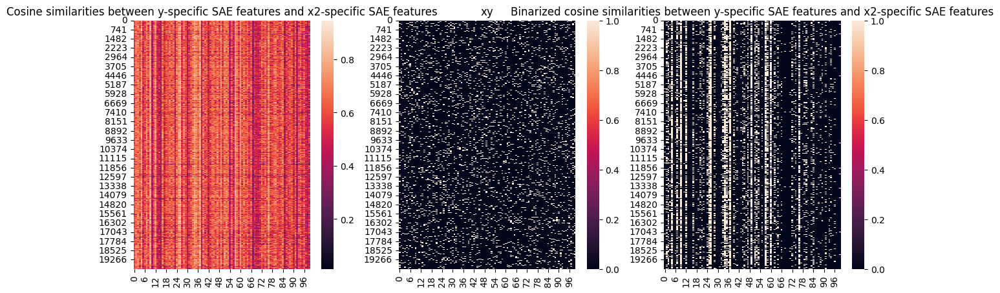

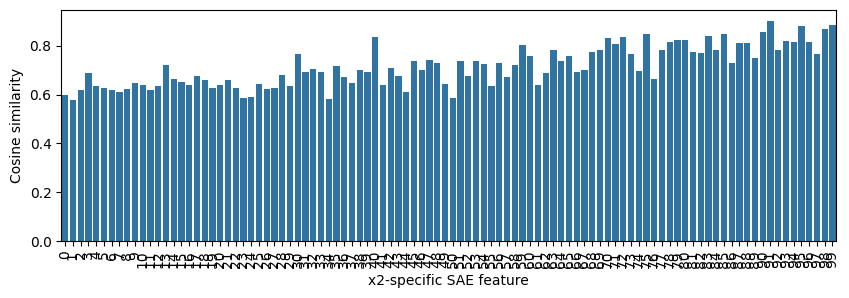

In [204]:
# find the new best y and x2 matching sae features

sae_feature_for_y_perturbed = []
for i in range(rna_counts_perturbed.shape[1]):
    sae_feature_for_y_perturbed.append(torch.argmax(cos_sim_ct_perturbed[i,:]).item())

non_y_sae_features_perturbed = list(set(unique_active_indices) - set(sae_feature_for_y_perturbed))

sae_feature_for_x2_perturbed = []
for i in range(20200,20300):
    sae_feature_for_x2_perturbed.append(non_y_sae_features_perturbed[torch.argmax(cos_sim[i,non_y_sae_features_perturbed]).item()])

# go througgh different thresholds and find the one that maximizes xy and the binary cosine sim matrix being identical
thresholds = np.linspace(0, 1, 100)

max_acc = 0
max_recall = 0
max_precision = 0
best_threshold = 0
accs = []
recalls = []
precisions = []

for threshold in thresholds:
    cos_sim_bin = (torch.abs(cos_sim_sae[sae_feature_for_y_perturbed,:][:,sae_feature_for_x2_perturbed]) > threshold).int()
    acc = (cos_sim_bin == xy.T).float().mean().item()
    # calc recall and precision
    tp = (cos_sim_bin * xy.T).sum().item()
    # false positive
    fp = ((cos_sim_bin - xy.T) == 1).sum().item()
    # false negative
    fn = ((xy.T - cos_sim_bin) == 1).sum().item()
    recall = tp / (tp + fn)
    precision = tp / (tp + fp + 1e-6)
    #if acc > max_acc:
    accs.append(acc)
    recalls.append(recall)
    precisions.append(precision)
    if precision > max_precision:
        max_acc = acc
        max_recall = recall
        max_precision = precision
        best_threshold = threshold
print('Best threshold {} with accuracy {}, recall {}, precision {}'.format(best_threshold, max_acc, max_recall, max_precision))

# plot the accuracy, recall and precision
fig, ax = plt.subplots(1, 3, figsize=(15,3))
sns.lineplot(x=thresholds, y=accs, ax=ax[0])
ax[0].set_title('Accuracy')
ax[0].set_xlabel('Threshold')
sns.lineplot(x=thresholds, y=recalls, ax=ax[1])
ax[1].set_title('Recall')
ax[1].set_xlabel('Threshold')
sns.lineplot(x=thresholds, y=precisions, ax=ax[2])
ax[2].set_title('Precision')
ax[2].set_xlabel('Threshold')
plt.show()
# take the threshold and plot the 3 matrices (cos_sim_sae, xy, cos_sim_bin)

threshold = 0.7
cos_sim_bin = (torch.abs(cos_sim_sae[sae_feature_for_y_perturbed,:][:,sae_feature_for_x2_perturbed]) > threshold).int()
acc = (cos_sim_bin == xy.T).float().mean().item()
tp = (cos_sim_bin * xy.T).sum().item()
fp = ((cos_sim_bin - xy.T) == 1).sum().item()
fn = ((xy.T - cos_sim_bin) == 1).sum().item()
recall = tp / (tp + fn)
precision = tp / (tp + fp + 1e-6)
print('Threshold: {}, Accuracy {}, recall {}, precision {}'.format(threshold, acc, recall, precision))
fig, ax = plt.subplots(1, 3, figsize=(15,5))
sns.heatmap(cos_sim_sae[sae_feature_for_y_perturbed,:][:,sae_feature_for_x2_perturbed], ax=ax[0])
ax[0].set_title('Cosine similarities between y-specific SAE features and x2-specific SAE features')
sns.heatmap(xy.T, ax=ax[1])
ax[1].set_title('xy')
cos_sim_bin = (torch.abs(cos_sim_sae[sae_feature_for_y_perturbed,:][:,sae_feature_for_x2_perturbed]) >= threshold).int()
sns.heatmap(cos_sim_bin, ax=ax[2])
ax[2].set_title('Binarized cosine similarities between y-specific SAE features and x2-specific SAE features')
plt.show()

# bar plot of the cosine similarities 
fig, ax = plt.subplots(1, 1, figsize=(10,3))
sns.barplot(x=range(len(sae_feature_for_x2_perturbed)), y=cos_sim[torch.arange(20200,20300),sae_feature_for_x2_perturbed])
# rotate the x labels
plt.xticks(rotation=90)
plt.ylabel('Cosine similarity')
plt.xlabel('x2-specific SAE feature')
plt.show()

In [223]:
print('{} genes, {} unique active units for all genes, {} remaining features'.format(
    len(sae_feature_for_y), len(set(sae_feature_for_y)), len(set(unique_active_indices) - set(sae_feature_for_y))
))

20000 genes, 1433 unique active units for all genes, 13486 remaining features


what is the structure here? I clearly have multiple genes per feature

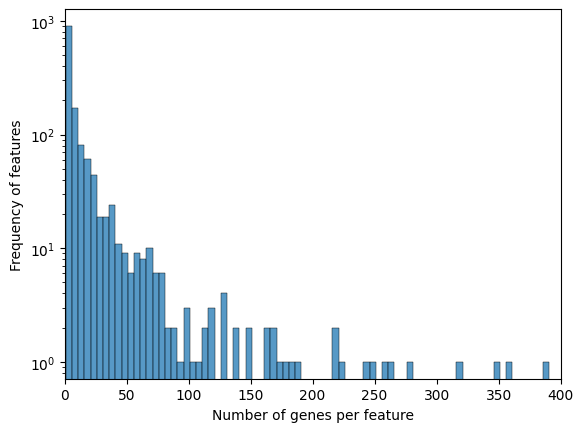

In [246]:
# get the number of genes for each feature from value counts of sae_feature_for_y
gene_counts = pd.Series(sae_feature_for_y).value_counts()
sns.histplot(gene_counts, binwidth=5)
plt.xlim(0, 400)
plt.yscale('log')
plt.xlabel('Number of genes per feature')
plt.ylabel('Frequency of features')
plt.show()

/tmp/ipykernel_1680213/1177991501.py:5: RuntimeWarning: invalid value encountered in divide
  'variance_expression': rna_counts.var(axis=0).numpy() / rna_counts.mean(axis=0).numpy(),


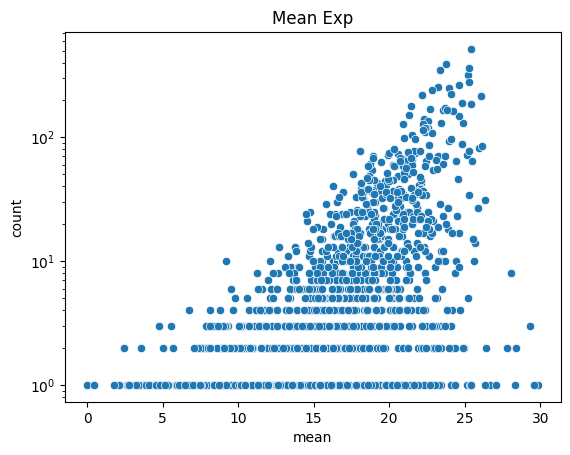

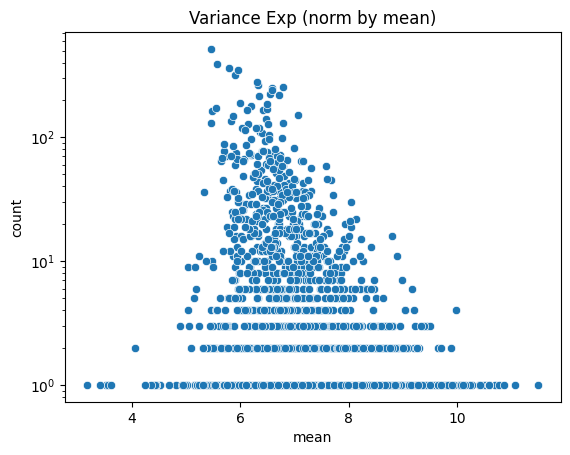

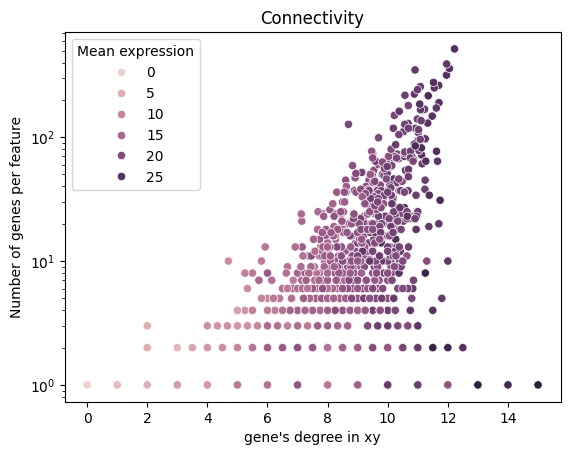

In [281]:
# plot sae feature counts against mean expression of y
gene_counts_df = pd.DataFrame({
    'sae_feature': sae_feature_for_y,
    'mean_expression': rna_counts.mean(axis=0).numpy(),
    'variance_expression': rna_counts.var(axis=0).numpy() / rna_counts.mean(axis=0).numpy(),
    'connectivity': xy.sum(axis=0).numpy()
})
# summary statistics
gene_counts_df = gene_counts_df.groupby('sae_feature').describe()
#print(gene_counts_df)
sns.scatterplot(x=gene_counts_df['mean_expression']['mean'], y=gene_counts_df['mean_expression']['count'])
plt.title('Mean Exp')
plt.yscale('log')
plt.show()

sns.scatterplot(x=gene_counts_df['variance_expression']['mean'], y=gene_counts_df['variance_expression']['count'])
plt.yscale('log')
plt.title('Variance Exp (norm by mean)')
plt.show()

sns.scatterplot(x=gene_counts_df['connectivity']['mean'], y=gene_counts_df['connectivity']['count'], hue=gene_counts_df['mean_expression']['mean'])
plt.yscale('log')
plt.title('Connectivity')
plt.xlabel("gene's degree in xy")
plt.ylabel('Number of genes per feature')
plt.legend(title='Mean expression')
plt.show()

In [247]:
xy.shape

torch.Size([100, 20000])

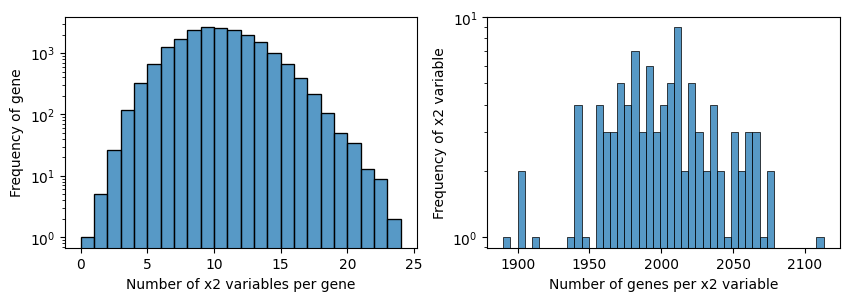

In [252]:
# what are the degrees in the yx matrix?
y_degrees = xy.sum(axis=0)

fig, ax = plt.subplots(1, 2, figsize=(10,3))
sns.histplot(y_degrees, binwidth=1, ax=ax[0])
#ax[0].set_xlim(0, 400)
ax[0].set_yscale('log')
ax[0].set_xlabel('Number of x2 variables per gene')
ax[0].set_ylabel('Frequency of gene')

y_degrees = xy.sum(axis=1)
sns.histplot(y_degrees, binwidth=5, ax=ax[1])
#ax[1].set_xlim(0, 400)
ax[1].set_yscale('log')
ax[1].set_xlabel('Number of genes per x2 variable')
ax[1].set_ylabel('Frequency of x2 variable')
plt.show()

In [227]:
# how else can I find other variables?

# get a cosine sim threshold for the y-specific features
# the threshold will be the lowest max cosine similarity of the y-specific features
# get the 5th percentile
threshold = np.percentile(cos_sim[:20000,:][:,unique_active_indices].max(dim=1).values, 5)
print(threshold)

non_y_non_redundant_sae_features = torch.where((cos_sim[:20000,:][:,unique_active_indices] > threshold).sum(1) > 0)[0].tolist()
print(len(non_y_non_redundant_sae_features))

0.8559271574020386
19000


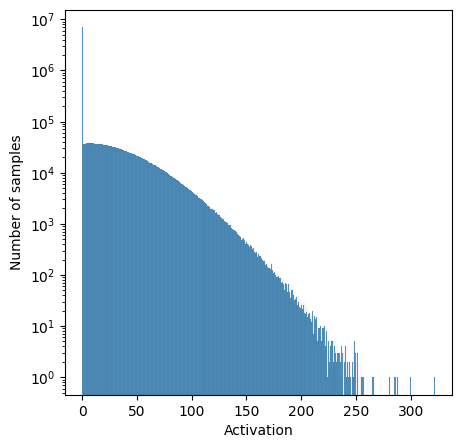

In [ ]:
# now a histogram

fig, ax = plt.subplots(1, 1, figsize=(5,5))
sns.histplot(activations.cpu().detach().numpy().flatten(), ax=ax)
plt.ylabel('Number of samples')
plt.xlabel('Activation')
plt.yscale('log')
plt.show()

In [36]:
comparison_data = torch.tensor(comparison_data).float()
activations = activations.cpu().detach()

In [37]:
cos_sim = torch.zeros((comparison_data.shape[0], activations.shape[1]))
for i in tqdm(range(comparison_data.shape[0])):
    cos_sim[i,:] = torch.nn.functional.cosine_similarity(activations, comparison_data[i,:].unsqueeze(1), dim=0).detach().cpu()
cos_sim

  0%|          | 0/20302 [00:00<?, ?it/s]

100%|██████████| 20302/20302 [03:41<00:00, 91.61it/s]


tensor([[0.4897, 0.8246, 0.6935,  ..., 0.5964, 0.5510, 0.6375],
        [0.2949, 0.6601, 0.3796,  ..., 0.5074, 0.3695, 0.7603],
        [0.3516, 0.8166, 0.5615,  ..., 0.4629, 0.4780, 0.7177],
        ...,
        [0.4562, 0.2546, 0.0856,  ..., 0.3480, 0.1823, 0.6009],
        [0.4790, 0.7992, 0.5661,  ..., 0.5119, 0.5387, 0.6427],
        [0.4223, 0.7188, 0.4909,  ..., 0.4664, 0.4270, 0.6805]])

In [14]:
cos_sim.shape

torch.Size([20302, 15000])

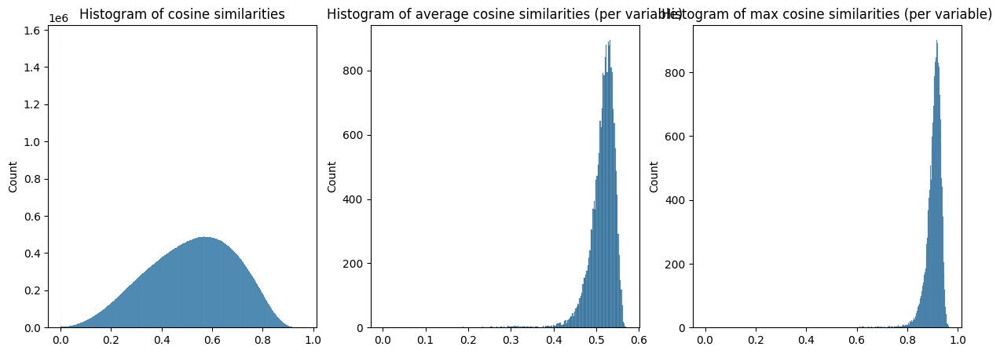

In [62]:
# plot all cosine similarities, as well as the averages and max per variable
cos_sim_avg = cos_sim.mean(axis=1)
cos_sim_max = cos_sim.max(axis=1).values

fig, ax = plt.subplots(1, 3, figsize=(15,5))
sns.histplot(cos_sim.flatten(), ax=ax[0])
ax[0].set_title('Histogram of cosine similarities')
sns.histplot(cos_sim_avg, ax=ax[1])
ax[1].set_title('Histogram of average cosine similarities (per variable)')
sns.histplot(cos_sim_max, ax=ax[2])
ax[2].set_title('Histogram of max cosine similarities (per variable)')
plt.show()

Question 1: Are there any active SAE dimension that do not represent any of our ground truth features? / Are all SAE dimensions meaningful?

If so, this would make it difficult and negate our assumption that all SAE features are meaningful.

In [38]:
unique_active_indices = get_unique_active_unit_indices(sae_model, train_loader, threshold=1)
print('Number of unique active units:', len(unique_active_indices))

# get the maximum cosine similarity for each active feature, as well as the index
# there is no function for this
max_cos_sim = torch.zeros((len(unique_active_indices), 2))
for i, idx in enumerate(unique_active_indices):
    max_cos_sim[i,0] = torch.max(cos_sim[:,idx]).item()
    max_cos_sim[i,1] = torch.argmax(cos_sim[:,idx]).item()

Number of unique active units: 14919


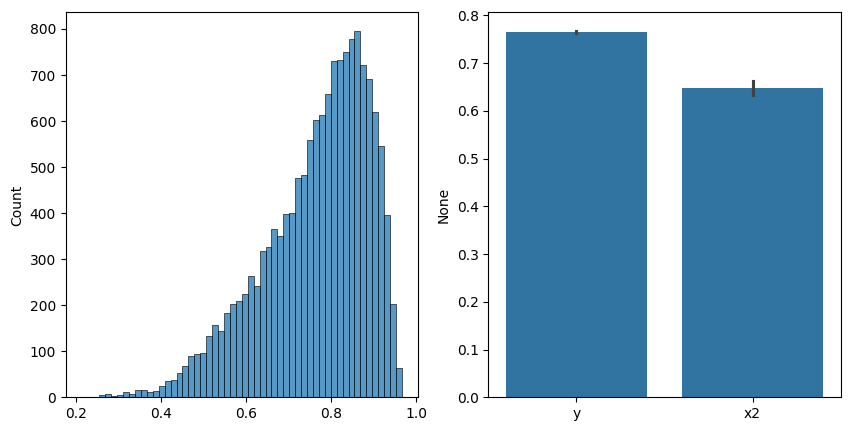

In [64]:
# plot the histogram of max_cos_sim
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(max_cos_sim[:,0], ax=ax[0])
# also plot this colored by the coeff_names
variable_colors = [coeff_names[int(x)] for x in max_cos_sim[:,1]]
sns.barplot(x=variable_colors, y=max_cos_sim[:,0], ax=ax[1])
plt.show()

Problematically, each active SAE feature has the highest cosine similarity with the observed data.

How many variables do we have per SAE feature?

0.21528953313827515


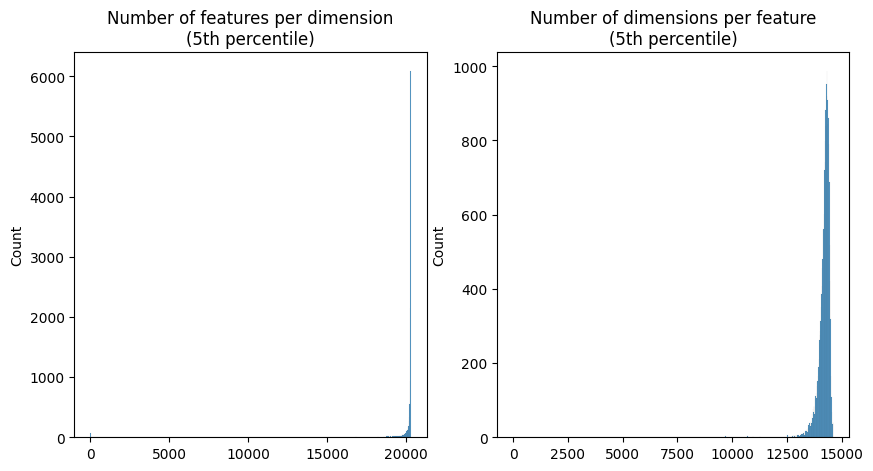

In [65]:
# what is the 5th percentile
threshold = np.percentile(np.abs(cos_sim[:,unique_active_indices]), 5)
print(threshold)

bool_superpositions = torch.abs(cos_sim) > threshold
features_per_dim = torch.sum(bool_superpositions, axis=0)
dims_per_feature = torch.sum(bool_superpositions, axis=1)

# plot histograms of both next to each other
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(features_per_dim, ax=ax[0])
ax[0].set_title('Number of features per dimension\n(5th percentile)')
sns.histplot(dims_per_feature, ax=ax[1])
ax[1].set_title('Number of dimensions per feature\n(5th percentile)')
plt.show()

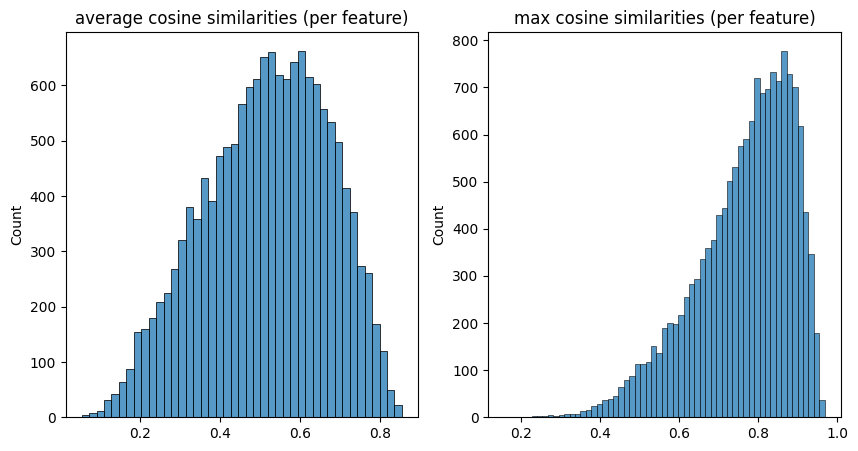

In [14]:
# plot all cosine similarities, as well as the averages and max per variable
cos_sim_avg = cos_sim[:,unique_active_indices].mean(axis=0)
cos_sim_max = cos_sim[:,unique_active_indices].max(axis=0).values

fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(cos_sim_avg, ax=ax[0])
ax[0].set_title('average cosine similarities (per feature)')
sns.histplot(cos_sim_max, ax=ax[1])
ax[1].set_title('max cosine similarities (per feature)')
plt.show()

### 150000 features

In [19]:
sae_model, loss = train_sae(
    train_loader,
    input_size=input_size,
    hidden_factor=1000,
    lr=1e-5,
    l1_weight=1e-2,
    n_epochs=1000,
    sae_type='bricken',
    return_all_losses=True
)

reps_reconstructed, activations = sae_model(reps.to(device))

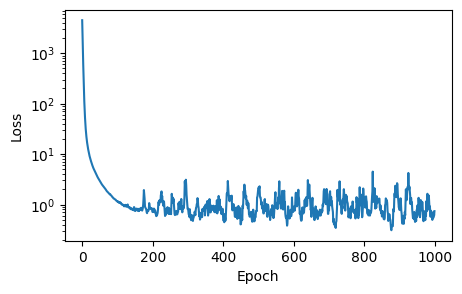

In [37]:
# plot the losses
fig, ax = plt.subplots(1, 1, figsize=(5,3))
sns.lineplot(x=range(len(loss)), y=loss, ax=ax)
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.yscale('log')
plt.show()

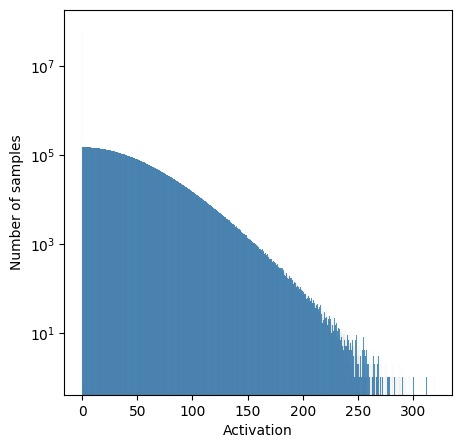

In [38]:
# now a histogram

fig, ax = plt.subplots(1, 1, figsize=(5,5))
sns.histplot(activations.cpu().detach().numpy().flatten(), ax=ax)
plt.ylabel('Number of samples')
plt.xlabel('Activation')
plt.yscale('log')
plt.show()

In [20]:
comparison_data = torch.tensor(comparison_data).float()
activations = activations.cpu().detach()

cos_sim = torch.zeros((comparison_data.shape[0], activations.shape[1]))
for i in tqdm(range(comparison_data.shape[0])):
    cos_sim[i,:] = torch.nn.functional.cosine_similarity(activations, comparison_data[i,:].unsqueeze(1), dim=0).detach().cpu()

/tmp/ipykernel_1643728/2692243819.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  comparison_data = torch.tensor(comparison_data).float()
100%|██████████| 20302/20302 [33:37<00:00, 10.06it/s]


In [42]:
cos_sim.shape

torch.Size([20302, 150000])

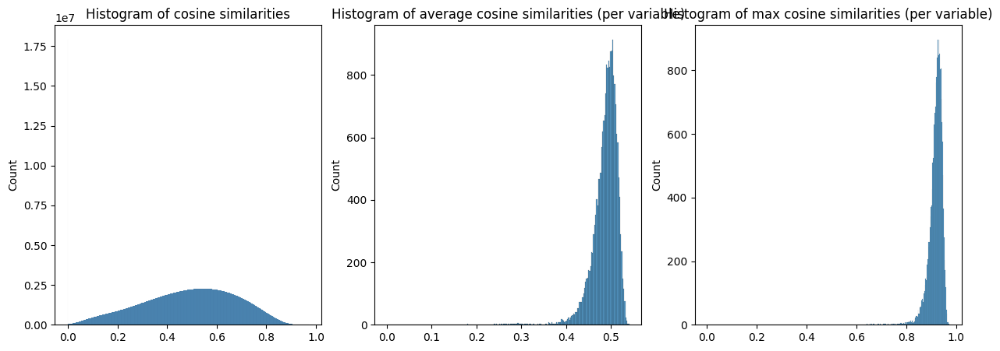

In [40]:
# plot all cosine similarities, as well as the averages and max per variable
cos_sim_avg = cos_sim.mean(axis=1)
cos_sim_max = cos_sim.max(axis=1).values

fig, ax = plt.subplots(1, 3, figsize=(15,5))
sns.histplot(cos_sim.flatten(), ax=ax[0])
ax[0].set_title('Histogram of cosine similarities')
sns.histplot(cos_sim_avg, ax=ax[1])
ax[1].set_title('Histogram of average cosine similarities (per variable)')
sns.histplot(cos_sim_max, ax=ax[2])
ax[2].set_title('Histogram of max cosine similarities (per variable)')
plt.show()

In [21]:
unique_active_indices = get_unique_active_unit_indices(sae_model, train_loader, threshold=1)
print('Number of unique active units:', len(unique_active_indices))

# get the maximum cosine similarity for each active feature, as well as the index
# there is no function for this
max_cos_sim = torch.zeros((len(unique_active_indices), 2))
for i, idx in enumerate(unique_active_indices):
    max_cos_sim[i,0] = torch.max(cos_sim[:,idx]).item()
    max_cos_sim[i,1] = torch.argmax(cos_sim[:,idx]).item()

Number of unique active units: 149197


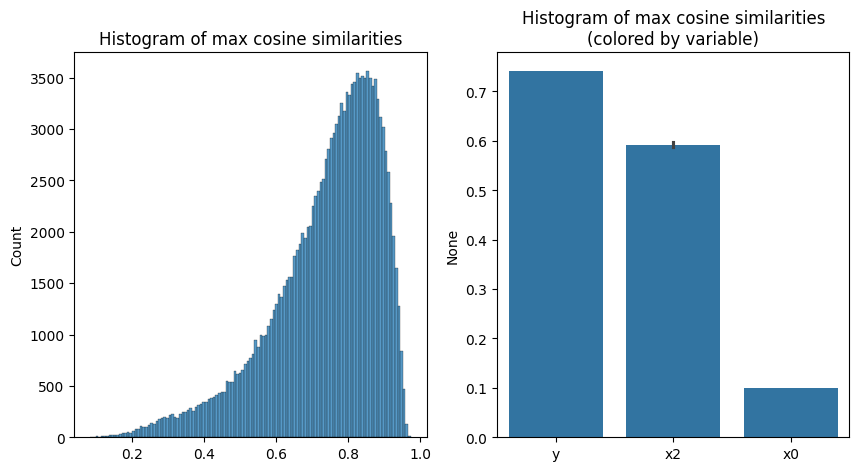

In [45]:
# plot the histogram of max_cos_sim
fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(max_cos_sim[:,0], ax=ax[0])
ax[0].set_title('Histogram of max cosine similarities')
# also plot this colored by the coeff_names
variable_colors = [coeff_names[int(x)] for x in max_cos_sim[:,1]]
sns.barplot(x=variable_colors, y=max_cos_sim[:,0], ax=ax[1])
ax[1].set_title('Histogram of max cosine similarities\n(colored by variable)')
plt.show()

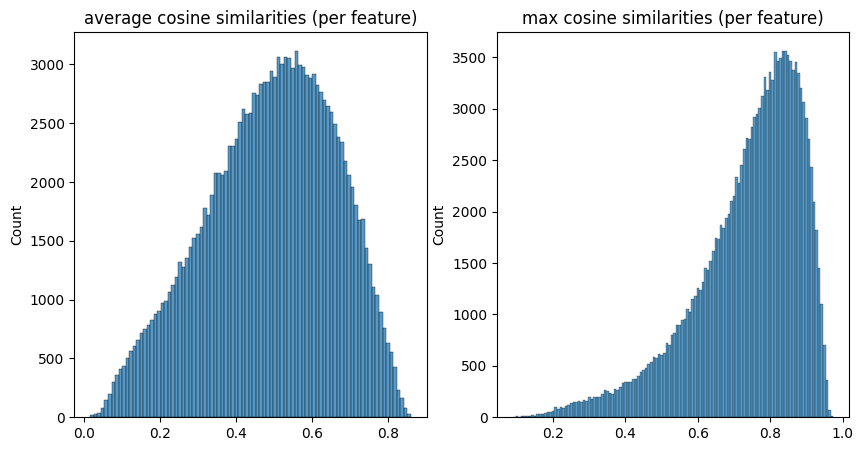

In [22]:
# plot all cosine similarities, as well as the averages and max per variable
cos_sim_avg = cos_sim[:,unique_active_indices].mean(axis=0)
cos_sim_max = cos_sim[:,unique_active_indices].max(axis=0).values

fig, ax = plt.subplots(1, 2, figsize=(10,5))
sns.histplot(cos_sim_avg, ax=ax[0])
ax[0].set_title('average cosine similarities (per feature)')
sns.histplot(cos_sim_max, ax=ax[1])
ax[1].set_title('max cosine similarities (per feature)')
plt.show()